<div style="text-align: center; font-size: 36px; font-weight: bold; color: #2E86C1;">Introduction to Data Science - Final Assignment</div>
<div style="text-align: center; font-size: 25px; font-weight: bold; color: #2E86C1;">PART A - Supervised Learning</div>
<div style="text-align: center; font-size: 20px; color: #555;">Group 005 | Eran Tascesme - 205708720 | David Perelman 206467870</div>

<div style="color: #D35400; font-size: 15px;"> 🔽 Import Libraries</div>

In [844]:
# imports
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm 
import pylab as py 
import xgboost as xgb
import joblib
import shap
from lime.lime_tabular import LimeTabularExplainer
from scipy.stats import zscore
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, KNNImputer, SimpleImputer
from sklearn.cluster import KMeans
from sklearn.feature_selection import VarianceThreshold, RFE
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, IsolationForest
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.neighbors import LocalOutlierFactor
from sklearn.metrics import mean_absolute_error
from skopt import BayesSearchCV    # scikit-optimize
from fancyimpute import KNN

import warnings
warnings.filterwarnings("ignore")


<div style="font-family: Times; text-align: center; font-size: 25px; font-weight: bold; background-color: #dfc8c6; color: #429eda;">1️⃣ <b>Initial Data Exploration</b></div></br>
<div style="color: #9238b7; font-size: 15px;"> ⌛ Load datasets and Display the first rows  </div>

In [846]:
# Load the datasets
train_data = pd.read_csv("Q1_train_dataset.csv")
test_data = pd.read_csv("Q1_test_dataset.csv")

# Display the first rows of each dataset
print("Training Dataset - First Rows:")
display(train_data.head())
print("\nTest Dataset - First Rows:")
display(test_data.head())

Training Dataset - First Rows:


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,20.0,RL,65.0,10606.0,Pave,NaN,IR1,HLS,AllPub,Inside,...,0.0,NaN,NaN,NaN,0.0,11.0,2007.0,NaN,partial,866374
1,60.0,RL,67.0,8664.0,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0.0,NaN,NaN,NaN,NaN,7.0,2008.0,WD,Normal,747537
2,120.0,RL,63.0,7947.0,Pave,NaN,IR1,HLS,AllPub,Inside,...,0.0,NaN,NaN,NaN,0.0,3.0,2007.0,WD,normal,1087535
3,60.0,FV,NaN,7092.0,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0.0,NaN,NaN,NaN,0.0,5.0,2007.0,WD,normal,796195
4,70.0,RM,48.0,6219.0,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0.0,NaN,NaN,NaN,0.0,5.0,2007.0,WD,Normal,531547



Test Dataset - First Rows:


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,60.0,RL,NaN,8810.0,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0.0,0.0,NaN,NaN,NaN,0.0,5.0,2010.0,WD,Normal
1,30.0,NaN,49.0,5912.0,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0.0,0.0,NaN,mnprv,NaN,NaN,7.0,NaN,WD,Normal
2,60.0,RL,55.0,9761.0,NaN,NaN,IR1,Lvl,AllPub,FR2,...,0.0,0.0,NaN,NaN,NaN,0.0,5.0,2006.0,WD,Normal
3,20.0,RL,73.0,11594.0,Pave,NaN,Reg,Lvl,NaN,FR2,...,0.0,0.0,NaN,NaN,NaN,0.0,4.0,NaN,WD,abnorml
4,20.0,FV,74.0,9076.0,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0.0,0.0,NaN,NaN,NaN,0.0,4.0,2010.0,WD,normal


<div style="font-family: Times; font-size: 16px; background-color: #EAF2F8; padding: 10px;">
💡After looking at the Readme.txt and reviewing the data, it is easy to distinguish which of the variables is numeric, categorical, or ordinal. </br>
Below are the results:
</div>

<div style="background-color: #EAF2F8; padding: 10px;">
<h5><u>1. Numeric Variables</u></h5>
<pre style="background-color: #EAF2F8; padding: 10px;">
<b>These are continuous or discrete numeric values:</b>

LotFrontage: Linear feet of street connected to the property.
LotArea: Lot size in square feet.
MasVnrArea: Masonry veneer area in square feet.
BsmtFinSF1: Type 1 finished square feet.
BsmtFinSF2: Type 2 finished square feet.
BsmtUnfSF: Unfinished square feet of the basement area.
TotalBsmtSF: Total square feet of the basement area.
1stFlrSF: First floor square feet.
2ndFlrSF: Second floor square feet.
LowQualFinSF: Low-quality finished square feet (all floors).
GrLivArea: Above-grade (ground) living area square feet.
Fireplaces: Number of fireplaces
GarageCars: Size of garage in car capacity
GarageArea: Size of the garage in square feet.
WoodDeckSF: Wood deck area in square feet.
OpenPorchSF: Open porch area in square feet.
EnclosedPorch: Enclosed porch area in square feet.
3SsnPorch: Three-season porch area in square feet.
ScreenPorch: Screen porch area in square feet.
PoolArea: Pool area in square feet.
MiscVal: Value of miscellaneous features.
GarageYrBlt: Garge built date (numeric representation).
YearBuilt: Construction date (numeric representation).
YearRemodAdd: Construction date (numeric representation).
MoSold: Month sold (numeric representation).
YrSold: Year sold (numeric representation).
</pre>

<h5><u>2. Categorical Variables</u></h5>
<pre style="background-color: #EAF2F8; padding: 10px;">
<b>These are variables that represent categories or groups:</b>

MSZoning: General zoning classification of the sale.
Street: Type of road access (Gravel/Paved).
Alley: Type of alley access (Gravel/Paved/None).
LotShape: General shape of the property.
LandContour: Flatness of the property.
Utilities: Type of utilities available.
LotConfig: Lot configuration.
LandSlope: Slope of the property.
Neighborhood: Physical locations within Ames city limits.
Condition1: Proximity to various conditions.
Condition2: Secondary proximity to various conditions.
BldgType: Type of dwelling.
RoofStyle: Type of roof.
RoofMatl: Roof material.
Exterior1st: Exterior covering on the house.
Exterior2nd: Secondary exterior covering on the house.
MasVnrType: Masonry veneer type.
Foundation: Type of foundation.
Heating: Type of heating.
CentralAir: Central air conditioning (Yes/No).
Electrical: Electrical system.
GarageType: Garage location.
GarageFinish: Interior finish of the garage.
PavedDrive: Paved driveway.
MiscFeature: Miscellaneous features.
SaleType: Type of sale.
SaleCondition: Condition of sale.
</pre>

<h5><u>3. Ordinal Variables</u></h5>
<pre style="background-color: #EAF2F8; padding: 10px;">
<b>These are categorical variables with a meaningful order:</b>

MSSubClass: Type of dwelling involved in the sale.
OverallQual: Overall material and finish quality.
OverallCond: Overall condition of the house.
ExterQual: Exterior material quality.
ExterCond: Exterior condition.
HouseStyle: Style of dwelling.
BsmtQual: Basement height.
BsmtCond: Basement condition.
BsmtExposure: Walkout or garden-level walls.
BsmtFinType1: Rating of basement finished area.
BsmtFinType2: Rating of basement finished area (if multiple types).
BsmtFullBath: Rating of basement full bathrooms.
BsmtHalfBath: Rating of basement half bathrooms.
FullBath: Grade of Full bathrooms above.
HalfBath: Grade of Half baths above.
BedroomAbvGr: Dont have information in Readme, looks like ordinal.
KitchenAbvGr: Dont have information in Readme, looks like ordinal.
TotRmsAbvGrd: Total rooms above grade.
HeatingQC: Heating quality and condition.
KitchenQual: Kitchen quality.
Functional: Home functionality.
FireplaceQu: Fireplace quality.
GarageQual: Garage quality.
GarageCond: Garage condition.
PoolQC: Pool quality.
Fence: Fence quality.
</pre>
</div>

<div style="color: #9238b7; font-size: 15px;"> 🔹 Arrange the columns into coressponding lists.</div>

In [850]:
# arrange each variable in corresponding list
numeric_columns = [
        "LotFrontage", "LotArea", "MasVnrArea", "BsmtFinSF1", "BsmtFinSF2", "Fireplaces",
        "BsmtUnfSF", "TotalBsmtSF", "1stFlrSF", "2ndFlrSF", "LowQualFinSF", "GarageYrBlt",
        "GrLivArea", "GarageArea", "WoodDeckSF", "OpenPorchSF", "EnclosedPorch", "GarageCars",
        "3SsnPorch", "ScreenPorch", "PoolArea", "MiscVal", "YearBuilt", 'YearRemodAdd', "MoSold", "YrSold"]

categorical_columns = [
        "MSZoning", "Street", "Alley", "LotShape", "LandContour", "Utilities", 
        "LotConfig", "LandSlope", "Neighborhood", "Condition1", "Condition2", 
        "BldgType", "RoofStyle", "RoofMatl", "Exterior1st", 
        "Exterior2nd", "MasVnrType", "Foundation", "Heating", "CentralAir", 
        "Electrical", "GarageType", "GarageFinish", "PavedDrive", 
        "MiscFeature", "SaleType", "SaleCondition"]

ordinal_columns = [
        "MSSubClass", "OverallQual", "OverallCond", "ExterQual", "ExterCond", 
        "HouseStyle", "BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1",
        "FullBath", "HalfBath", "BsmtFullBath", "BsmtHalfBath", "BedroomAbvGr",
        "BsmtFinType2", "HeatingQC", "KitchenQual", "Functional", "FireplaceQu",
        "GarageQual","GarageCond", "PoolQC", "Fence", "KitchenAbvGr", "TotRmsAbvGrd"]


<div style="color: #9238b7; font-size: 15px;"> 🔹 Converts values ​​in categorical and ordinal columns to lowercase. (if they strings) for good EDA </div>

In [852]:
columns_to_lowercase = categorical_columns + ordinal_columns

for col in columns_to_lowercase:
    if col not in ["MSSubClass", "OverallQual", "OverallCond"] and col in train_data.columns: 
        train_data[col] = train_data[col].apply(lambda x: x.lower() if isinstance(x, str) else x)




<div style="font-family: Times; text-align: center; font-size: 25px; font-weight: bold; background-color: #dfc8c6; color: #429eda;">2️⃣ <b>EDA</b></div>

<div style="font-family: Times; font-size: 16px; background-color: #EAF2F8; padding: 10px;">
✨ <b>Numeric variables measuers and visualization that i used:</b> </br>
 &nbsp;&nbsp;🔹  <u>.describe()</u> function - to see characteristics of each feature. </br>
 &nbsp;&nbsp;🔹 <u>Histograms/QQplot/Boxplot/Kdeplot</u> - to identify proximity to a some distribution. </br>
</br>
✨ <b>Categorical and Ordinal variables measuers and visualization that i used:</b></br>
 &nbsp;&nbsp;🔹 <u>.value_count() function</u> - to see frequency of each category.</br>
 &nbsp;&nbsp;🔹 <u>PieChart</u> - to get proportions of each category.
</div>

<div style="font-family: Times; font-size: 16px; background-color: #EAF2F8; padding: 10px;">
<h4><b>Summary for each variable:</b></h4>
<h4><u>Target "SalePrice"</u></h4>
<pre style="font-family: Times; font-size: 16px; background-color: #EAF2F8; padding: 10px;">have 1 negative sample - <u>will be deleted</u>
and have 10 very large values ​​that are disproportionate to the other values. - <u>samples will be deleted</u> </pre>

<h4><u>1. Numeric Variables</u></h4>
<p>*According to the QQ-plot, none of the features are close to a normal distribution<p>
<pre style="font-family: Times; font-size: 16px; background-color: #EAF2F8; padding: 10px;">
- PoolArea, MiscVal: Most of the data is 0, contains NaNs and inf - probably junk features - <u>features will be deleted</u>.
- LotFrontage: Positively skewed data with reasonable variation
- YrSold: Positively skewed data with reasonable variation, have samples with values greater then 2025 - <u>samples will be deleted</u>
- LotArea: Positively skewed data with big variation.
- GarageYrBlt: Negatively skewed data with big variation - too many bad values - <u>feature will be deleted</u>.
- BsmtUnfSF: Negatively skewed data with big variation.
- Fireplaces: Symmetric data with reasonable variation, have samples with negative values - <u>samples will be deleted</u>
- TotalBsmtSF, 1stFlrSF, 2ndFlrSF, GrLivArea, GarageArea: Symmetric data with big variation.
- YearBuilt: Symmetric data with reasonable variation, have samples with values greater then 2025 - <u>samples will be deleted</u>
- YearRemodAdd: Negatively skewed data with big variation. it must be greater or equal to YearBuilt.
- MoSold, GarageCars: Symmetric data with reasonable variation, have samples with negative values - <u>samples will be deleted</u>
- MasVnrArea, BsmtFinSF1, BsmtFinSF2, LowQualFinSF, WoodDeckSF, OpenPorchSF, EnclosedPorch, 3SsnPorch, ScreenPorch: Imbalance features - most of the values are 0 - <u>features will be deleted</u>.
</pre>

<h4><u>2. Categorical Variables</u></h4>
<pre style="font-family: Times; font-size: 16px; background-color: #EAF2F8; padding: 10px;">
- MSZoning: Imbalance feature, "RL" category appears more than 70% - <u>feature will be deleted</u>.
- Street: Imbalance feature, "PAVE" category appears more than 99% - <u>feature will be deleted</u>.
- Alley: 2 categories - balanced feature.
- LotShape: Balanced feature, but "IR2" and "IR3" categories have tiny instances, will merge them to "other"
- LandContour: Imbalance feature, "Lvl" category appears more than 89% - <u>feature will be deleted</u>.
- Utilities: Single category 99% of the time - <u>feature will be deleted</u>.
- LotConfig: Imbalance feature, "Inside" category appears more than 70% - <u>feature will be deleted</u>.
- LandSlope: Imbalance feature, "Gtl" category appears more than 95% - <u>feature will be deleted</u>.
- Neighborhood: Balanced feature, but some categories have tiny instances. Will get attention in the Outliers section.
- Condition1: Imbalance feature, "Norm" category appears more than 86% - <u>feature will be deleted</u>.
- Condition2: Single category 99% of the time -<u> feature will be deleted</u>.
- BldgType: Imbalance feature, "1Fam" category appears more than 83% - <u>feature will be deleted</u>.
- RoofStyle: Imbalance feature, "Gable" category appears more than 78% - <u>feature will be deleted</u>.
- RoofMatl: Single category - <u>feature will be deleted</u>.
- Exterior1st, Exterior2nd: Balanced features with tiny instances. will merge them to "other"
- MasVnrType: Imbalance feature, "BrkFace" category appears more than 70% - <u>feature will be deleted</u>.
- Foundation: Balanced feature with tiny instances. will merge them to "other"
- Heating: Imbalance feature, "GasA" category appears more than 98% - <u>feature will be deleted</u>.
- CentralAir: Imbalance feature, "Y" category appears more than 93% - <u>feature will be deleted</u>.
- Electrical: Balanced feature.
- GarageType: Imbalance feature, "attchd" category appears more than 62% - <u>feature will be deleted</u>.
- GarageFinish: Balanced feature.
- PavedDrive: Imbalance feature, "Y" category appears more than 90% - <u>feature will be deleted</u>.
- MiscFeature: Imbalance feature, "Shed" category appears more than 92% - <u>feature will be deleted</u>.
- SaleType: Imbalance feature, "WD" category appears more than 86% - <u>feature will be deleted</u>.
- SaleCondition: imbalance feature, "noraml" category appears more than 81% - <u> feature will be deleted </u>
</pre>

<h4><u>3. Ordinal Variables</u></h4>
<pre style="font-family: Times; font-size: 16px; background-color: #EAF2F8; padding: 10px;">
- MSSubClass: Imbalance feature - values will be merged into 3 groups [0,60), [60,100), [100,190] as 1, 2, 3.
- OverallQual: Imbalance feature - values will be merged into 3 groups <6, =6, >6 as 1, 2, 3.
- OverallCond: Imbalance feature - values will be merged into 3 groups <5, =5, >5, 1, 2, 3.
- ExterQual, ExterCond: Imbalance features - values will be merged into 2 groups (po, fa, ta) and (gd, ex) as 1, 2.
- ExterCond: Imbalance feature, "ta" appears more than 87% - <u>feature will be deleted</u>., ta) and (gd, ex) as 1, 2.
- HouseStyle: Imbalance feature - values will be merged into 2 groups (slvl, sfoyer, 2.5unf, 2.5fin, 2story) and (1.5fin, 1.5unf, 1story) as 1, 2.
- BsmtQual: Imbalance feature - values will be merged into 2 groups (po, fa, ta) and (gd, ex) as 1, 2.
- BsmtCond: Imbalance feature, "TA" appears more than 91% - <u>feature will be deleted</u>.
- BsmtExposure: Imbalance feature - values will be merged into 2 groups (ma, no) and (av, gd, mn) as 1, 2.
- BsmtFinType1: Imbalance feature - values will be merged into 3 groups (na, unf), (rec, blq, lwq), (alq, glq) as 1, 2, 3.
- BsmtFinType2: Imbalance feature, "unf" appears more than 87% - <u>feature will be deleted</u>.
- BsmtFullBath: Balance feature - values greater than 2 will merge to 2
- BsmtHalfBath: Imbalance feature, "0" appears more than 94% - <u>feature will be deleted</u>.
- FullBath: Balance feature - values greater than 2 will merge to 2
- HalfBath: Balance feature - values greater than 2 will merge to 2
- BedroomAbvGr: Imbalance feature, cant find a good grouping - <u>feature will be deleted</u>.
- KitchenAbvGr: Imbalance feature, cant find a good grouping - <u>feature will be deleted</u>.
- TotRmsAbvGrd: Imbalance feature - have a values with few instances - every num 4- be 4 and every num 11+ be 11.
- HeatingQC: Imbalance feature, "fa" appears more than 98% - <u>feature will be deleted</u>.
- KitchenQual: Imbalance feature - values will be merged into 2 groups (po, fa, ta) and (gd, ex) as 1, 2.
- Functional: Imbalance feature, "typ" appears more than 98% - <u>feature will be deleted</u>.
- FireplaceQu: Imbalance feature - values will be merged into 2 groups (po, fa, ta) and (gd, ex) as 1, 2.
- GarageQual, GarageCond: Imbalance features, "ta" appears more than 94% - <u>features will be deleted</u>.
- PoolQC: Balance feature - values will be changed like (po, fa, ta, gd, ex) as 1, 2, 3, 4, 5.
- Fence: Imbalance feature - values will be merged into 3 groups (na, mnww, gdwo), mnprv, gdprv as 1, 2, 3.
</pre>

<div style="color: #D35400; font-size: 20px;"> 🔬<b> Measures, Methods and Visualizations for EDA</b></div>

<div style="color: #9238b7; font-size: 17px;"> 🔹 EDA for <b>Numeric</b> features </div>
<h5>&nbsp; &nbsp;&nbsp; &nbsp;using .describe(), histograms, QQ-plot, boxplot and kdeplot</h5>

In [858]:
train_data[numeric_columns].describe()

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,Fireplaces,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,...,EnclosedPorch,GarageCars,3SsnPorch,ScreenPorch,PoolArea,MiscVal,YearBuilt,YearRemodAdd,MoSold,YrSold
count,1945.000000,2344.000000,2303.000000,2315.000000,2337.000000,2320.000000,2338.000000,2321.000000,2323.000000,2344.000000,...,2332.000000,2329.000000,2330.000000,2331.000000,2310.0,2313.0,2319.000000,2317.000000,2334.000000,2337.000000
mean,68.572751,10176.070392,105.559271,442.571058,49.976466,0.851293,555.587254,1056.765187,1167.452002,717.355375,...,23.783448,2.223272,2.839485,16.496782,inf,inf,1971.282018,1985.038843,6.200943,2007.920839
std,23.828498,7518.891802,183.488099,469.669497,167.452937,0.971721,450.787602,485.670062,439.838686,230.079970,...,65.875934,1.014902,25.387863,57.533773,NaN,NaN,30.902778,30.156805,2.776328,2.488359
min,18.000000,1325.000000,-329.000000,-1721.000000,0.000000,-3.000000,-1688.000000,-2067.000000,-2083.000000,-1167.000000,...,-71.000000,-3.000000,0.000000,-282.000000,0.0,0.0,1867.000000,1524.000000,-2.000000,2006.000000
25%,57.000000,7466.750000,0.000000,0.000000,0.000000,0.000000,218.250000,802.000000,889.000000,573.000000,...,0.000000,2.000000,0.000000,0.000000,0.0,0.0,1953.000000,1967.000000,4.000000,2007.000000
50%,67.000000,9504.500000,0.000000,369.000000,0.000000,1.000000,471.000000,1002.000000,1097.000000,684.500000,...,0.000000,2.000000,0.000000,0.000000,0.0,0.0,1973.000000,1995.000000,6.000000,2008.000000
75%,80.000000,11640.500000,170.000000,738.000000,0.000000,2.000000,797.000000,1325.000000,1403.000000,842.000000,...,0.000000,3.000000,0.000000,0.000000,0.0,0.0,2000.000000,2006.000000,8.000000,2009.000000
max,314.000000,215223.000000,1384.000000,5652.000000,1528.000000,4.000000,2336.000000,6135.000000,5102.000000,2539.000000,...,1013.000000,5.000000,407.000000,579.000000,inf,inf,2042.000000,2013.000000,12.000000,2039.000000


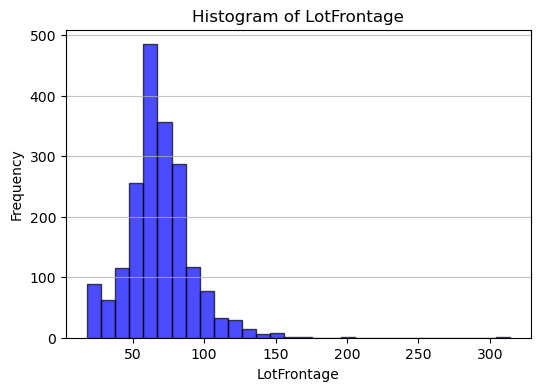

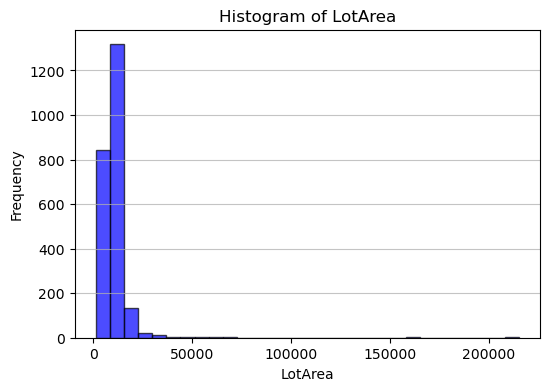

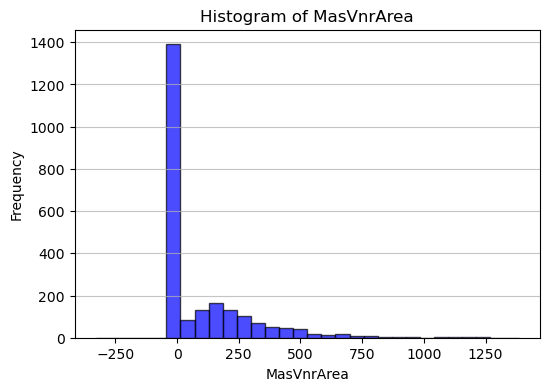

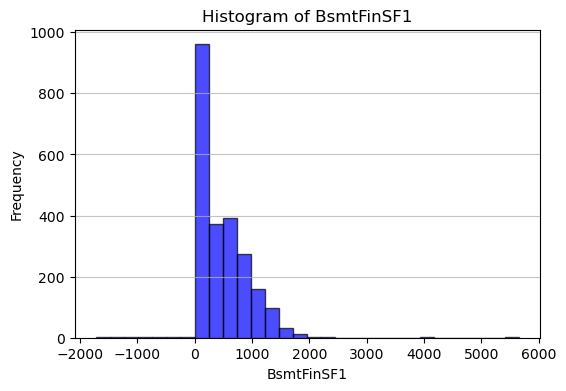

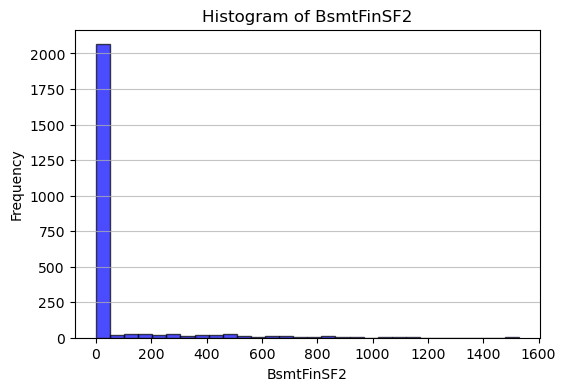

...

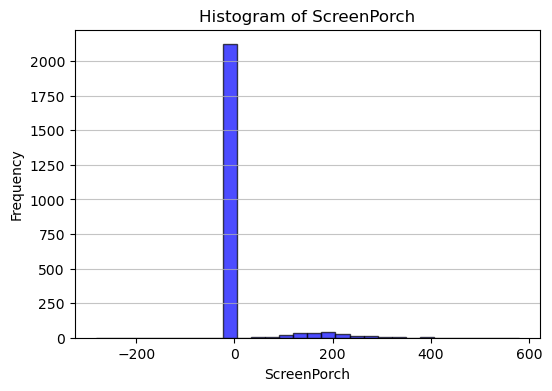

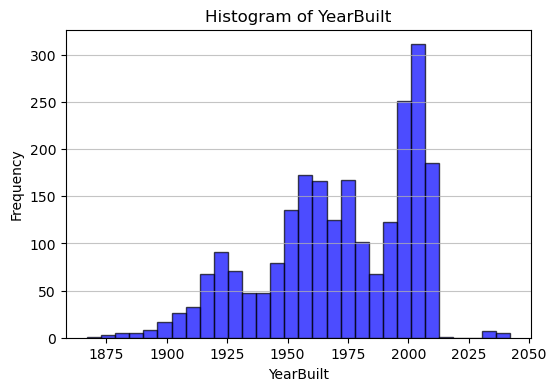

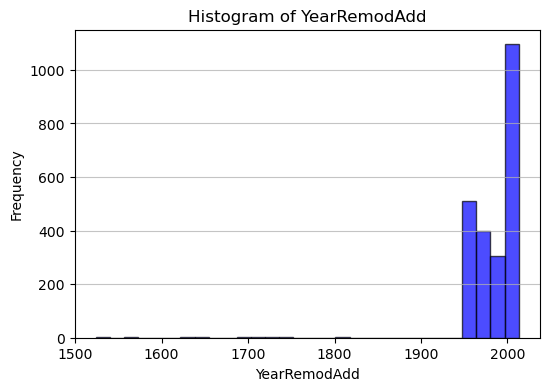

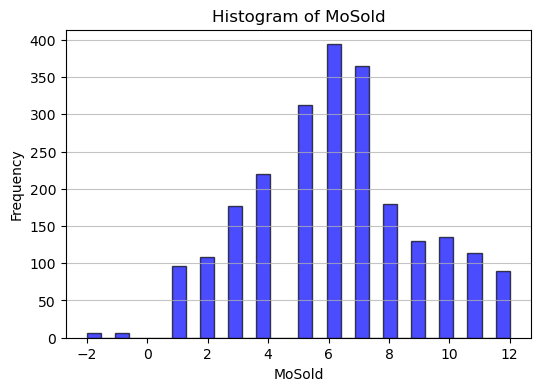

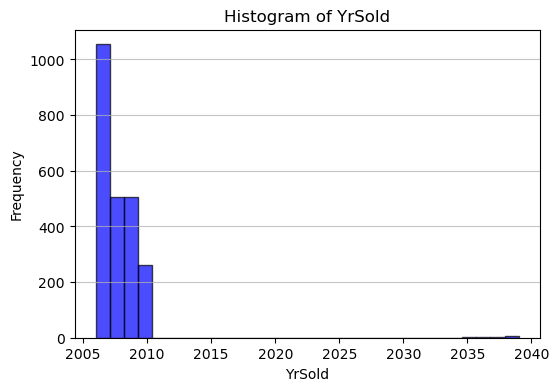

In [859]:
# Plot histograms for each column
for column in numeric_columns:
    if column != "PoolArea" and column != "MiscVal":   # those columns have inf and nans
        plt.figure(figsize=(6, 4))
        plt.hist(train_data[column], bins=30, color='blue', alpha=0.7, edgecolor='black')
        plt.title(f'Histogram of {column}')
        plt.xlabel(column)
        plt.ylabel('Frequency')
        plt.grid(axis='y', alpha=0.75)
        plt.show()

LotFrontage


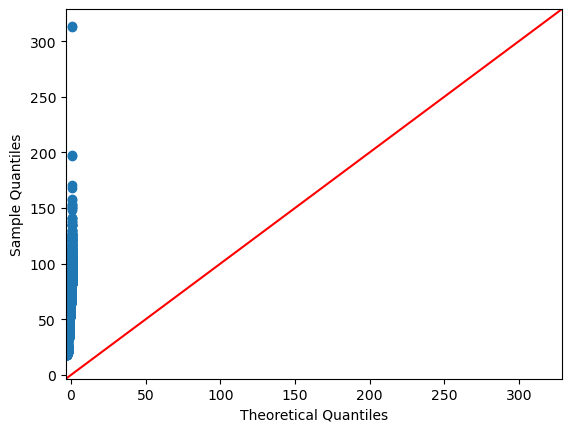

LotArea


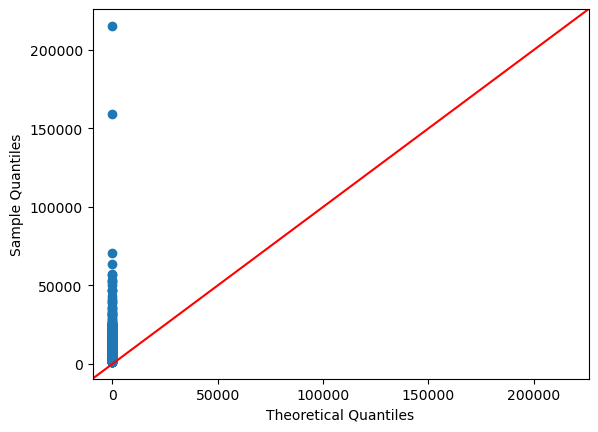

MasVnrArea


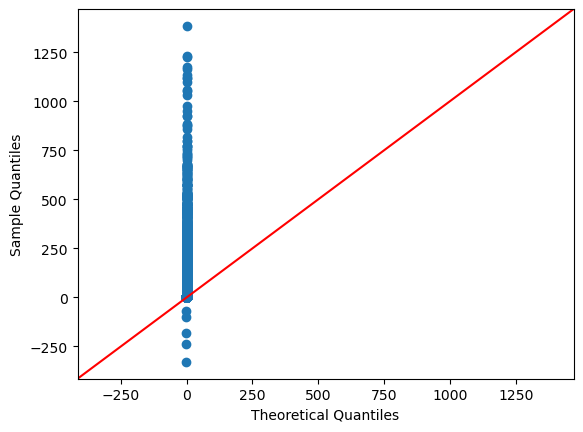

BsmtFinSF1


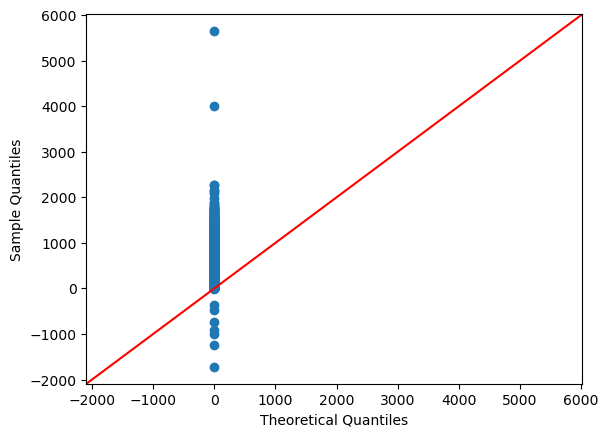

BsmtFinSF2


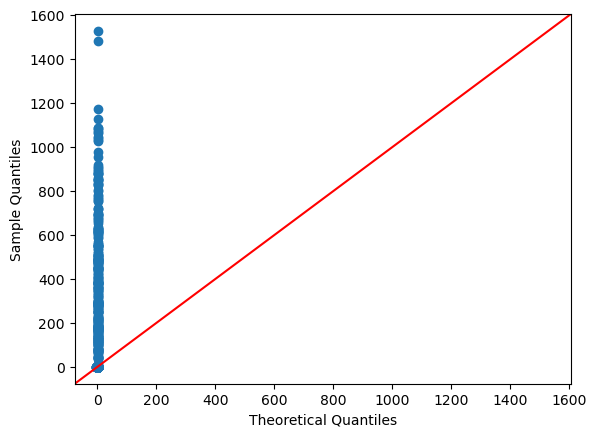

Fireplaces


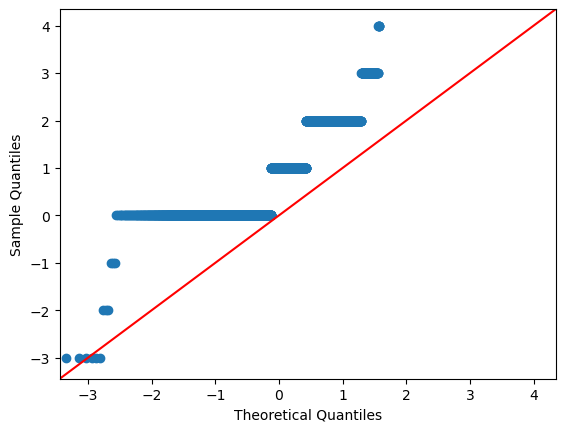

BsmtUnfSF


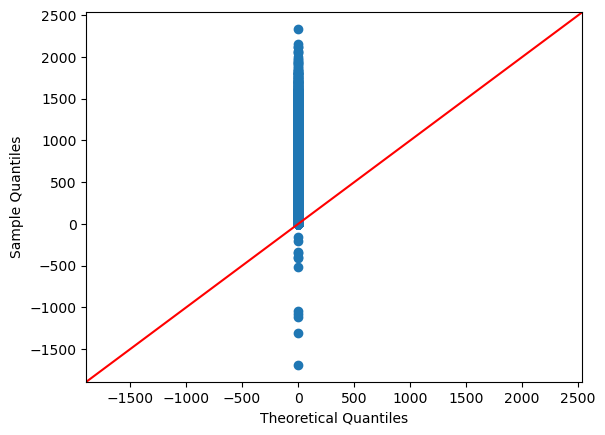

TotalBsmtSF


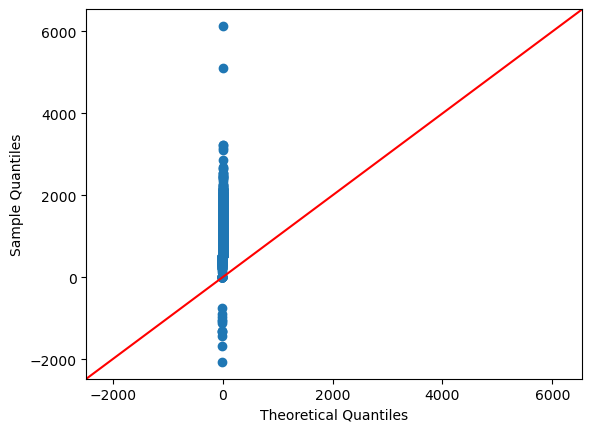

1stFlrSF


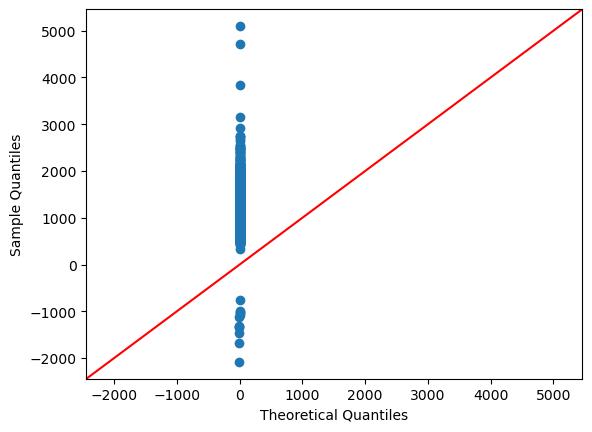

2ndFlrSF


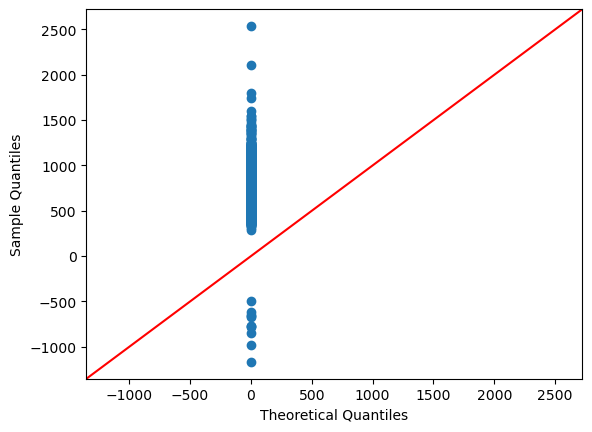

LowQualFinSF


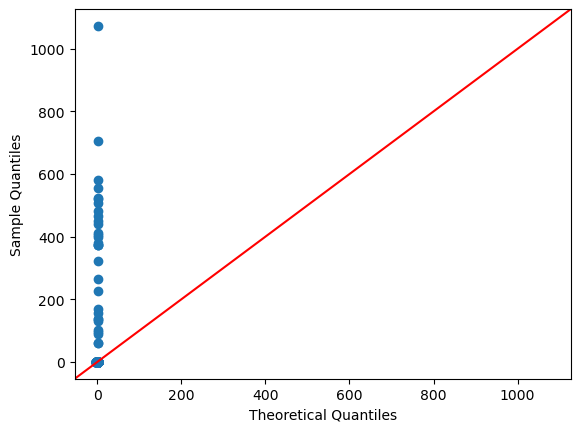

GarageYrBlt


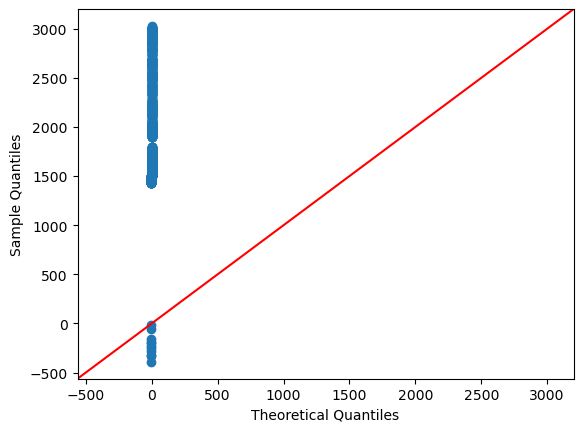

GrLivArea


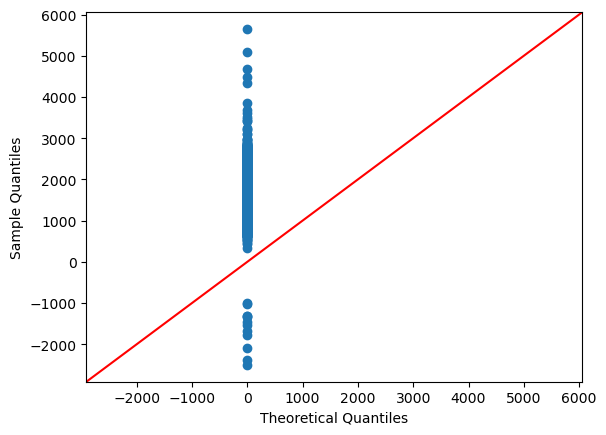

GarageArea


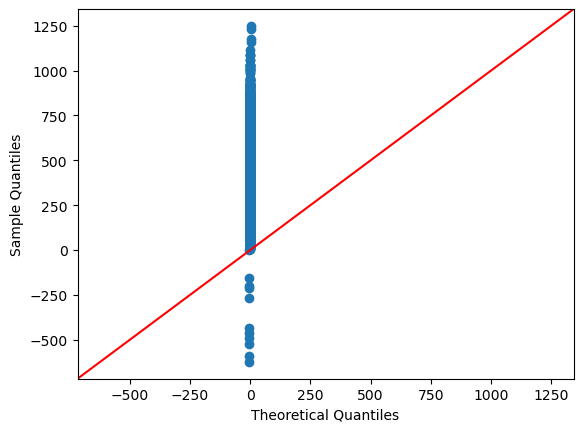

WoodDeckSF


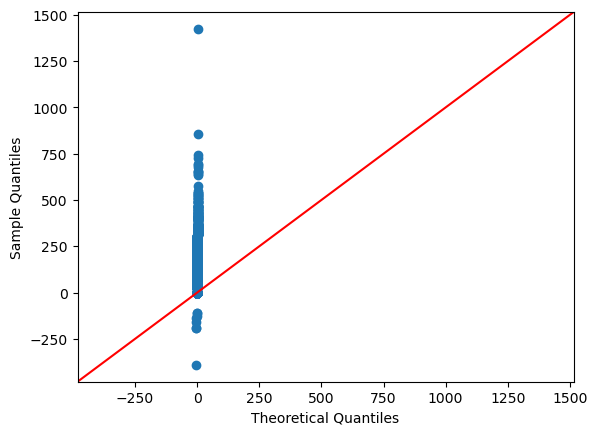

OpenPorchSF


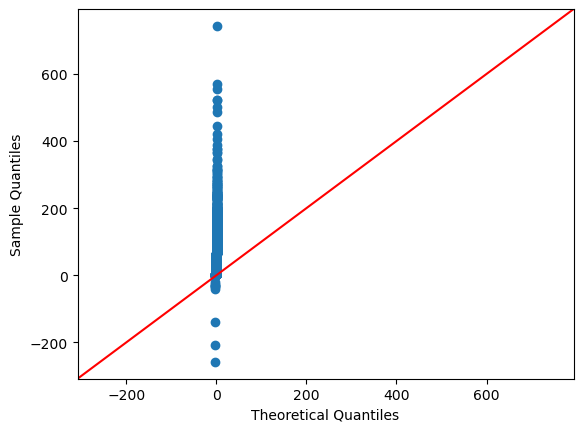

EnclosedPorch


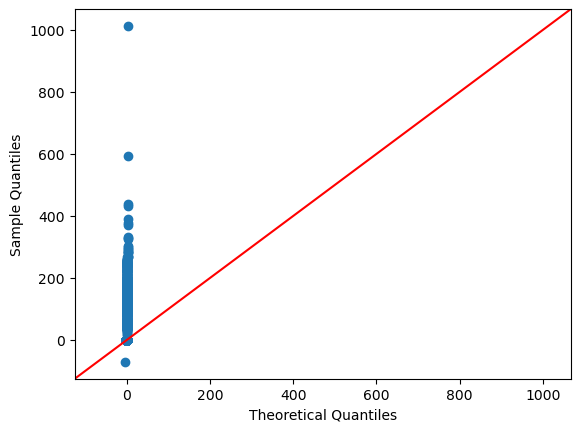

GarageCars


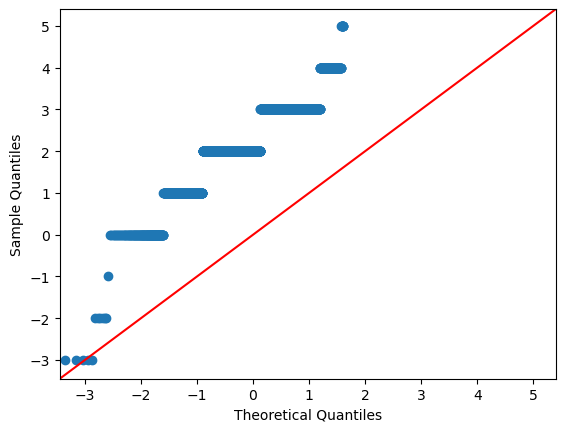

3SsnPorch


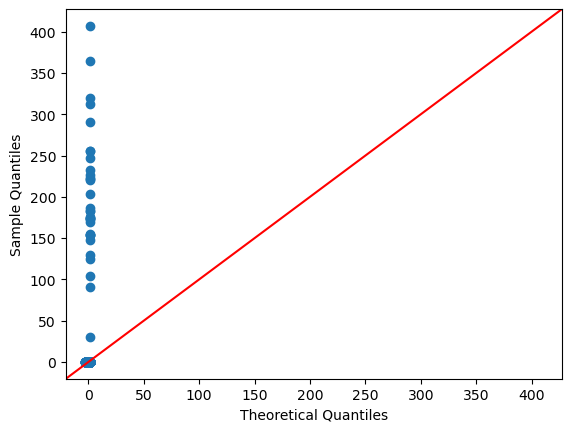

ScreenPorch


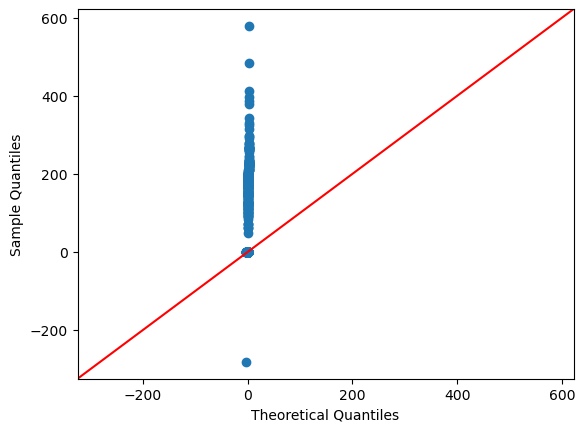

YearBuilt


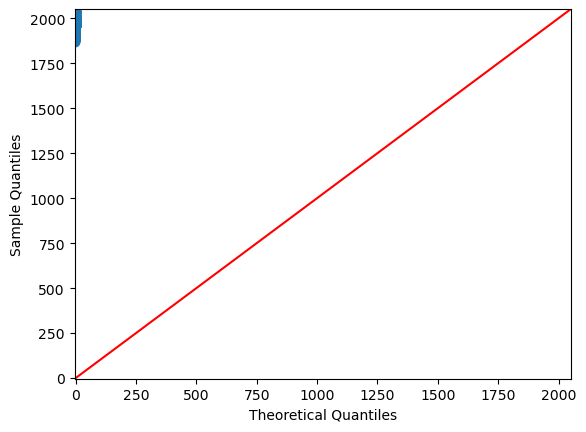

YearRemodAdd


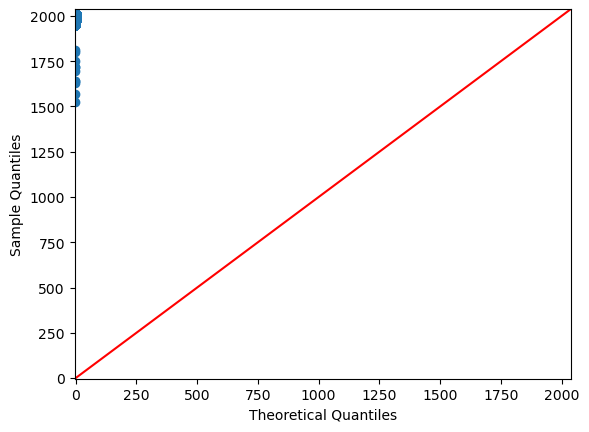

MoSold


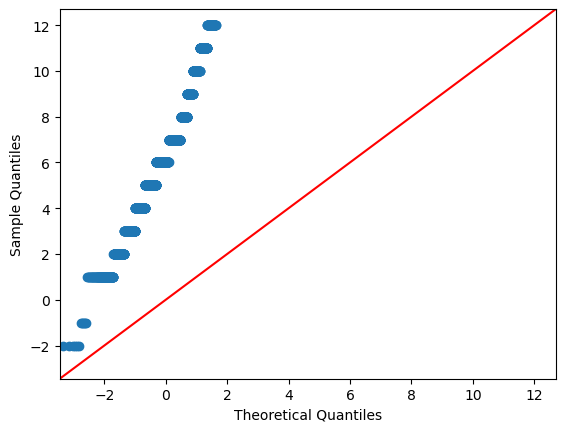

YrSold


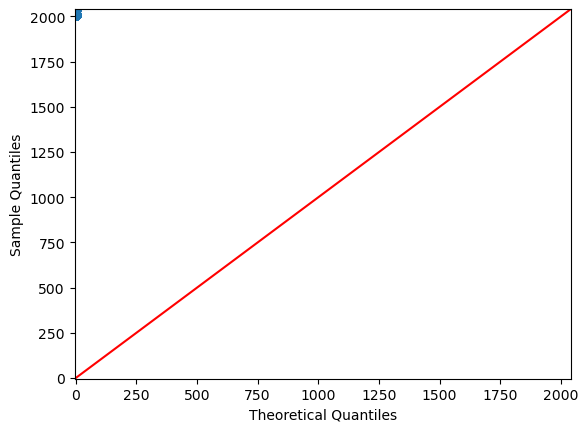

In [860]:
# plot QQ-plots
for column in numeric_columns:
    if column != "PoolArea" and column != "MiscVal":
        data_points = train_data[column]
        print(column)
        sm.qqplot(data_points, line ='45') 
        py.show() 

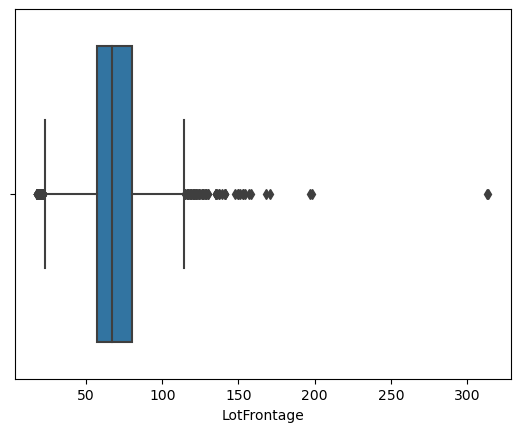

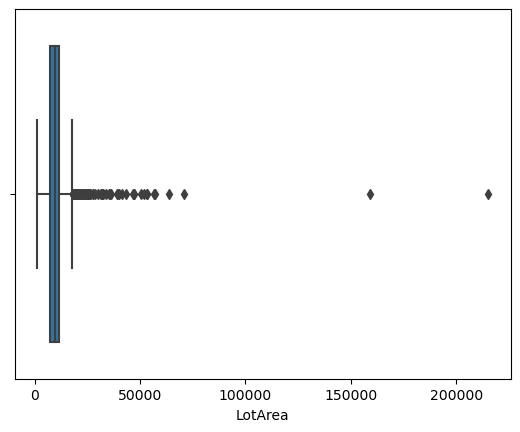

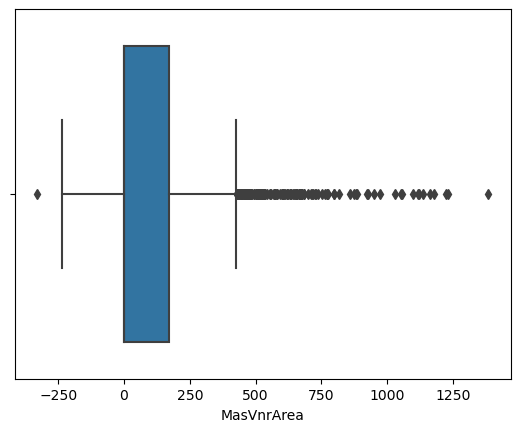

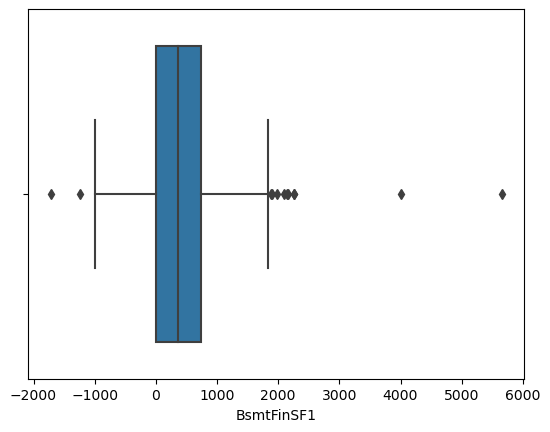

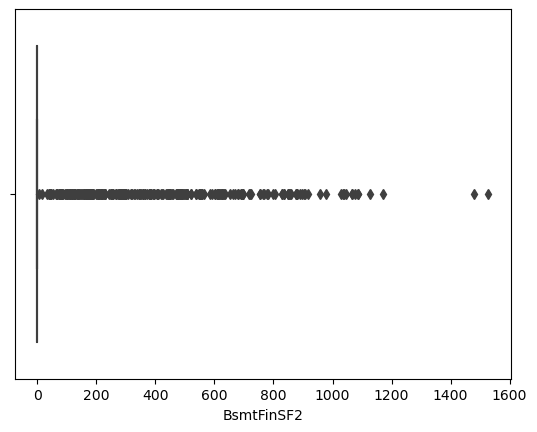

...

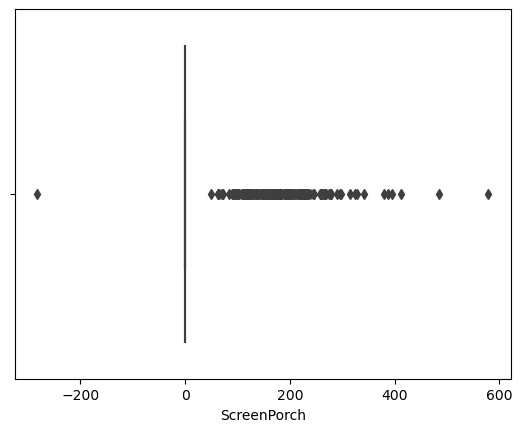

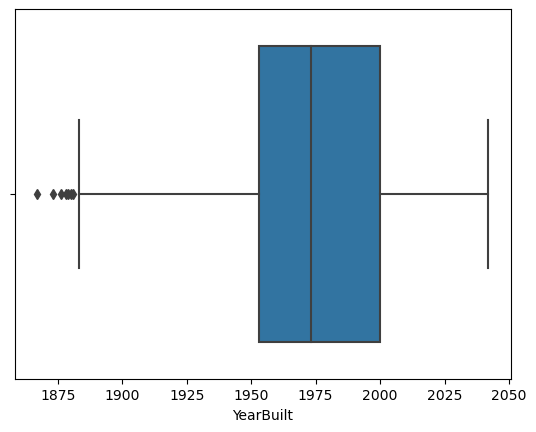

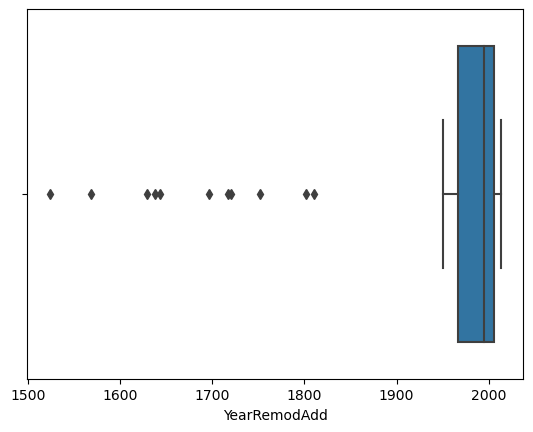

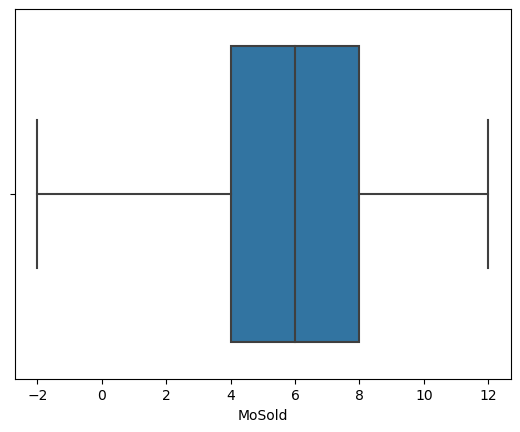

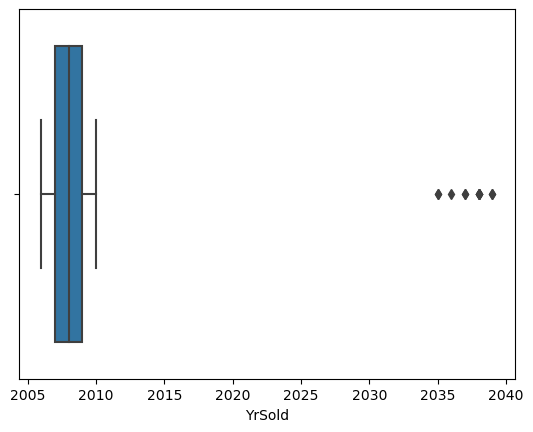

In [861]:
# plot boxplots
for column in numeric_columns:
    if column != "PoolArea" and column != "MiscVal":
        data_points = train_data[column]
        plt.figure()
        sns.boxplot(x=data_points)
        

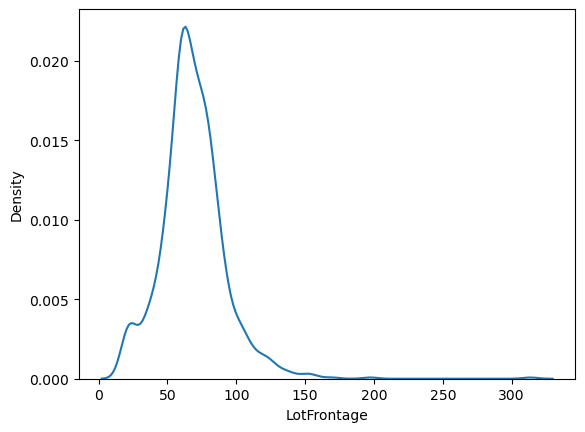

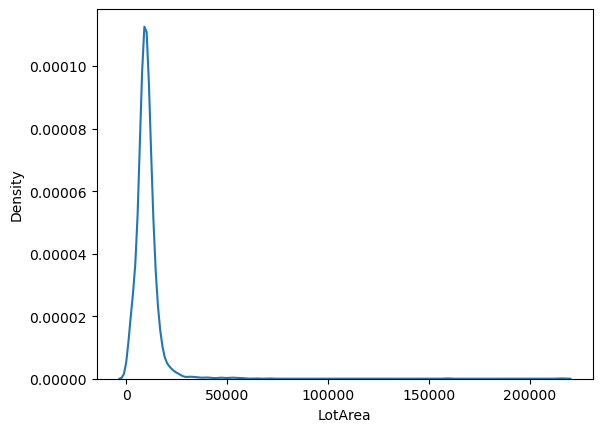

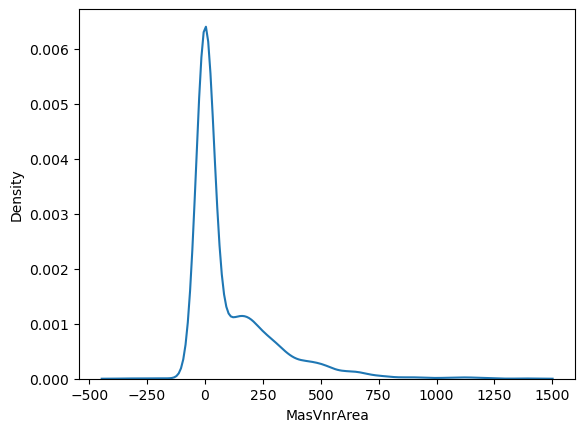

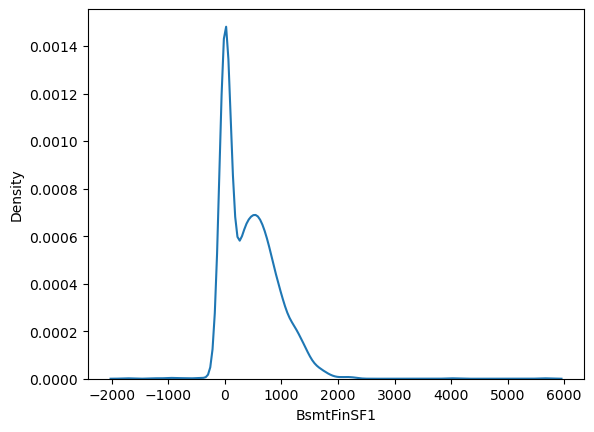

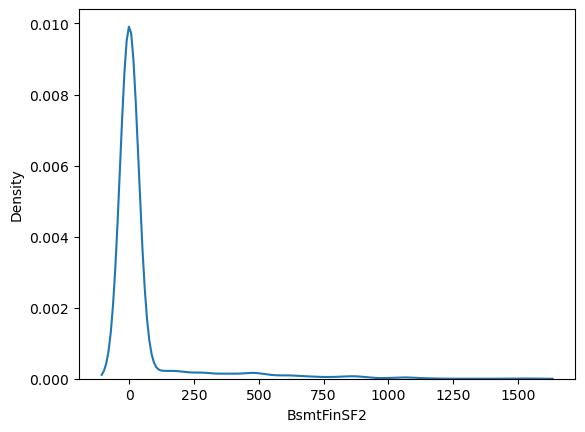

...

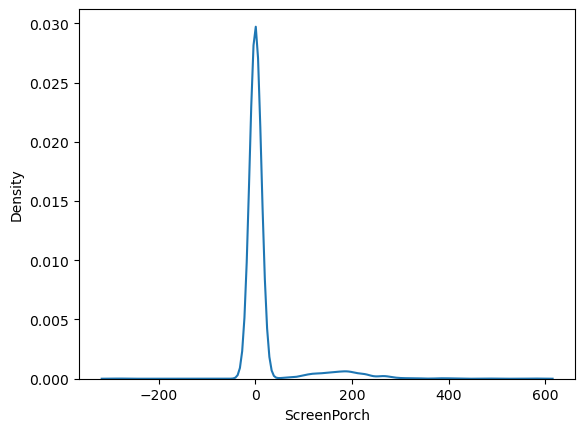

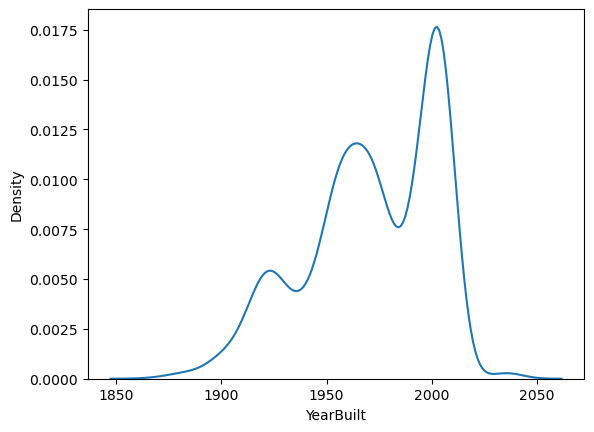

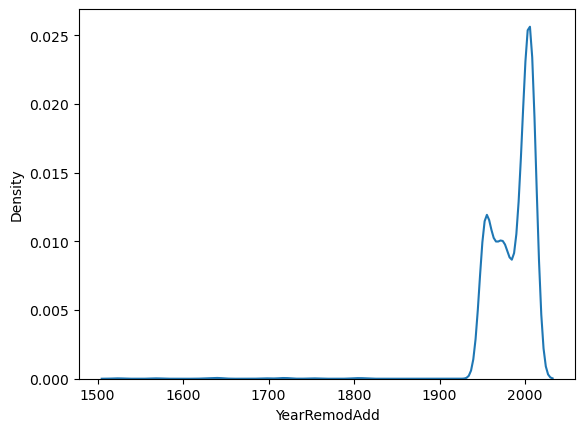

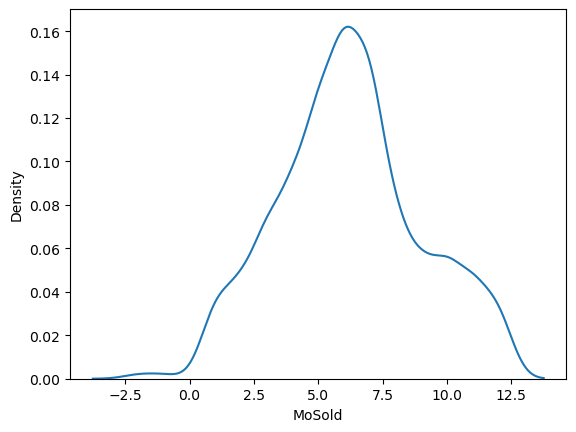

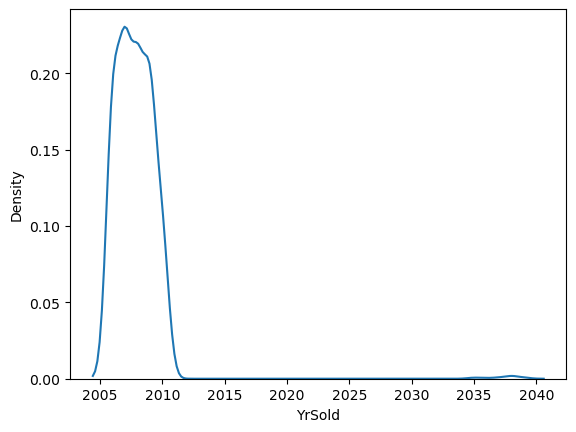

In [862]:
# plot kdeplots
for column in numeric_columns:
    if column != "PoolArea" and column != "MiscVal":
        data_points = train_data[column]
        plt.figure()
        sns.kdeplot(x=data_points)

<div style="color: #9238b7; font-size: 17px;"> 🔹 EDA for <b>categorical</b> features </div>
<h5>&nbsp; &nbsp;&nbsp; &nbsp;using .value_counts() and PieChart</h5>

In [864]:
for category in categorical_columns:
    display(train_data[category].value_counts())

MSZoning
rl         1797
rm          366
fv          108
c (all)      23
rh           21
a (agr)       3
i (all)       2
Name: count, dtype: int64

Street
pave    2306
grvl      10
Name: count, dtype: int64

Alley
grvl    94
pave    61
Name: count, dtype: int64

LotShape
reg    1460
ir1     794
ir2      59
ir3      14
Name: count, dtype: int64

LandContour
lvl    2084
hls     100
bnk      85
low      49
Name: count, dtype: int64

Utilities
allpub    2336
nosewr       1
nosewa       1
Name: count, dtype: int64

LotConfig
inside     1693
corner      397
culdsac     143
fr2          67
fr3          12
Name: count, dtype: int64

LandSlope
gtl    2231
mod     102
sev      12
Name: count, dtype: int64

Neighborhood
names      352
collgcr    207
oldtown    187
edwards    152
somerst    149
nridght    136
gilbert    131
sawyer     118
nwames     114
sawyerw    101
brkside     91
mitchel     91
crawfor     90
idotrr      74
noridge     56
timber      54
stonebr     41
swisu       39
clearcr     33
meadowv     30
blmngtn     26
veenker     23
brdale      23
blueste      7
grnhill      2
landmrk      1
Name: count, dtype: int64

Condition1
norm      2009
feedr      127
artery      69
rran        38
posn        29
rrae        20
posa        16
rrnn         7
rrne         4
Name: count, dtype: int64

Condition2
norm      2310
feedr        8
artery       5
posn         4
posa         3
rrnn         2
rran         1
Name: count, dtype: int64

BldgType
1fam      1926
twnhse     184
duplex      84
twnhs       83
2fmcon      40
Name: count, dtype: int64

RoofStyle
gable      1847
hip         446
gambrel      19
flat         17
mansard      11
shed          4
Name: count, dtype: int64

RoofMatl
metal    2327
Name: count, dtype: int64

Exterior1st
vinylsd    806
wd sdng    361
metalsd    353
hdboard    343
plywood    180
cemntbd    104
brkface     69
wdshing     43
stucco      35
asbshng     35
brkcomm      6
cblock       3
stone        2
imstucc      2
precast      1
asphshn      1
Name: count, dtype: int64

Exterior2nd
vinylsd    800
metalsd    361
wd sdng    335
hdboard    314
plywood    207
cmentbd    100
wd shng     64
stucco      43
brkface     34
asbshng     29
brk cmn     16
imstucc     12
stone        4
cblock       3
asphshn      2
precast      1
other        1
Name: count, dtype: int64

MasVnrType
brkface    692
stone      200
brkcmn      19
cblock       1
Name: count, dtype: int64

Foundation
pconc     1040
cblock     977
brktil     244
slab        38
stone       12
wood         5
Name: count, dtype: int64

Heating
gasa     2302
gasw       24
grav        9
wall        5
othw        2
floor       1
Name: count, dtype: int64

CentralAir
y    2178
n     149
Name: count, dtype: int64

Electrical
fusea    562
fusep    447
mix      430
fusef    404
Name: count, dtype: int64

GarageType
attchd     1382
detchd      624
builtin     158
basment      30
2types       19
carport      10
Name: count, dtype: int64

GarageFinish
unf    966
rfn    654
fin    574
Name: count, dtype: int64

PavedDrive
y    116
n     11
p      1
Name: count, dtype: int64

MiscFeature
shed    72
gar2     3
othr     2
elev     1
Name: count, dtype: int64

SaleType
wd       2006
new       194
cod        67
conld      17
conlw      10
cwd        10
conli       6
con         5
oth         4
vwd         1
Name: count, dtype: int64

SaleCondition
normal     1920
partial     199
abnorml     160
family       37
alloca       16
adjland      11
Name: count, dtype: int64

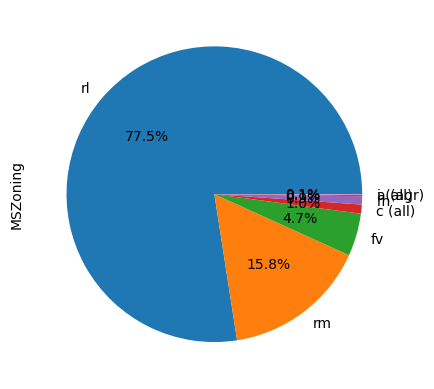

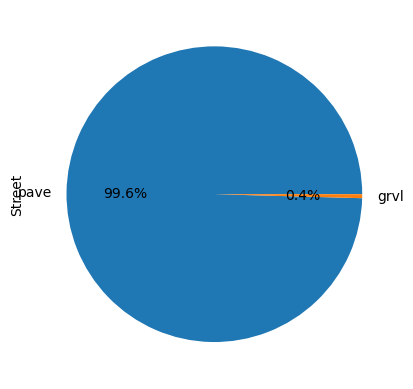

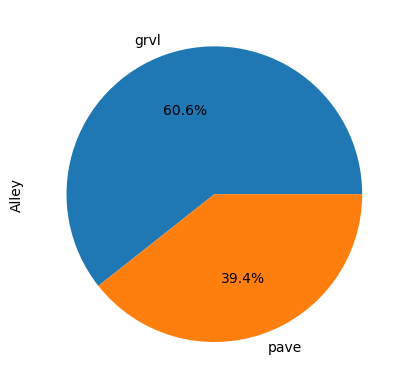

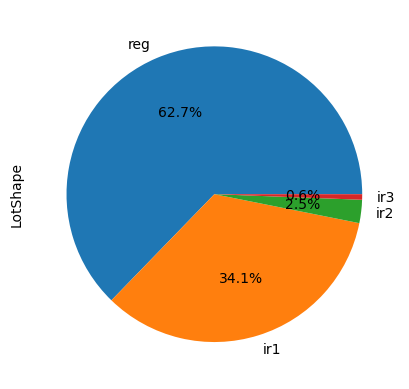

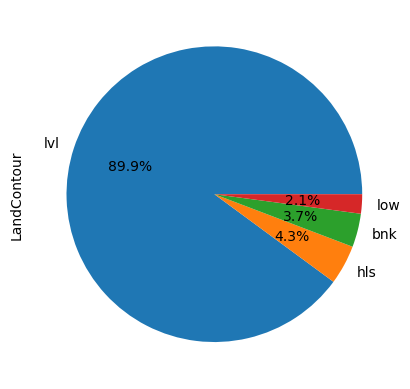

...

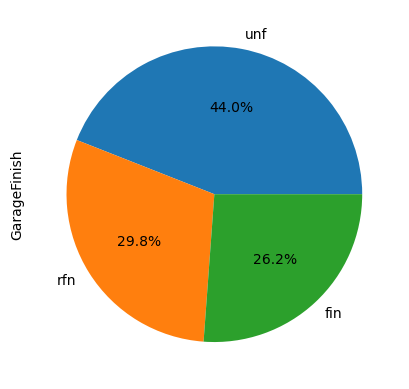

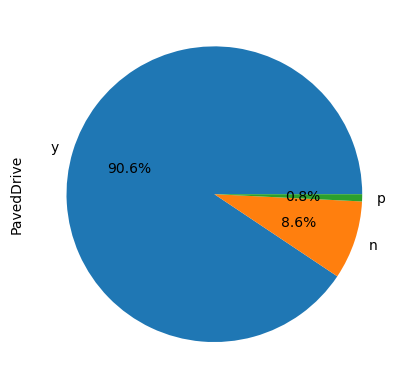

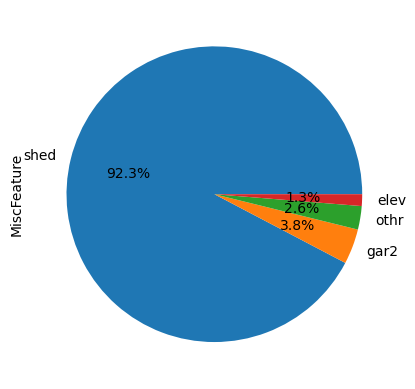

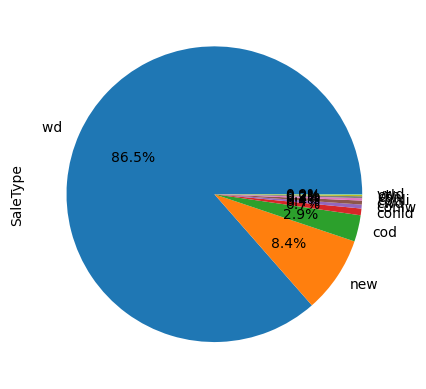

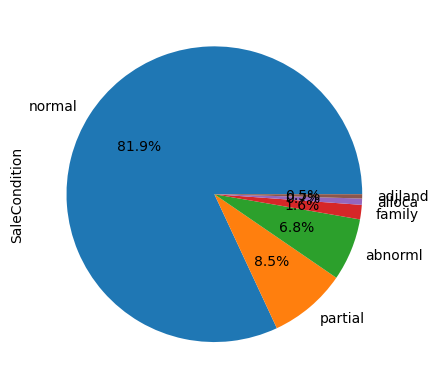

In [865]:
for category in categorical_columns:
    data_counts = train_data[category].value_counts()
    data_counts = data_counts.rename(category)
    plt.figure()
    data_counts.plot.pie(autopct='%1.1f%%')

<div style="color: #9238b7; font-size: 17px;"> 🔹 EDA for <b>Ordinal</b> features </div>
<h5>&nbsp; &nbsp;&nbsp; &nbsp;using .value_counts() and PieChart</h5>

In [867]:
for column in ordinal_columns:
    display(train_data[column].value_counts().sort_index())  # use sort_index for future merge operations

MSSubClass
20.0     856
30.0     107
40.0       6
45.0      10
50.0     223
60.0     449
70.0     115
75.0      20
80.0     103
85.0      37
90.0      87
120.0    158
150.0      1
160.0    106
180.0     11
190.0     42
Name: count, dtype: int64

OverallQual
1.0       5
2.0      10
3.0      27
4.0     187
5.0     645
6.0     591
7.0     487
8.0     274
9.0      95
10.0     28
Name: count, dtype: int64

OverallCond
1.0       4
2.0       7
3.0      44
4.0      74
5.0    1320
6.0     415
7.0     314
8.0     111
9.0      38
Name: count, dtype: int64

ExterQual
ex      90
fa      23
gd     798
ta    1410
Name: count, dtype: int64

ExterCond
ex      10
fa      50
gd     234
po       3
ta    2031
Name: count, dtype: int64

HouseStyle
1.5fin     249
1.5unf      11
1story    1190
2.5fin       8
2.5unf      17
2story     691
sfoyer      65
slvl       112
Name: count, dtype: int64

BsmtQual
ex     208
fa      73
gd     967
po       2
ta    1004
Name: count, dtype: int64

BsmtCond
ex       2
fa      85
gd      98
po       6
ta    2081
Name: count, dtype: int64

BsmtExposure
av     334
gd     233
mn     199
no    1489
Name: count, dtype: int64

BsmtFinType1
alq    347
blq    205
glq    693
lwq    127
rec    218
unf    669
Name: count, dtype: int64

FullBath
0.0       7
1.0     545
2.0    1100
3.0     639
4.0      23
5.0       2
Name: count, dtype: int64

HalfBath
0.0    1439
1.0     423
2.0     440
3.0      13
Name: count, dtype: int64

BsmtFullBath
0.0    1343
1.0     455
2.0     508
3.0      17
4.0       1
Name: count, dtype: int64

BsmtHalfBath
0.0    2198
1.0      70
2.0      62
3.0       3
Name: count, dtype: int64

BedroomAbvGr
0.0      7
1.0     37
2.0    376
3.0    883
4.0    810
5.0    165
6.0     34
7.0      4
Name: count, dtype: int64

BsmtFinType2
alq      41
blq      49
glq      24
lwq      74
rec      92
unf    1972
Name: count, dtype: int64

HeatingQC
ex       9
fa    2290
gd       6
po       2
ta      24
Name: count, dtype: int64

KitchenQual
ex     168
fa      59
gd     926
po       1
ta    1164
Name: count, dtype: int64

Functional
maj1      16
maj2       8
min1      57
min2      56
mod       28
sal        2
sev        2
typ     2144
Name: count, dtype: int64

FireplaceQu
ex     36
fa     58
gd    608
po     44
ta    482
Name: count, dtype: int64

GarageQual
ex       2
fa      96
gd      22
po       6
ta    2102
Name: count, dtype: int64

GarageCond
ex       2
fa      64
gd      16
po      13
ta    2116
Name: count, dtype: int64

PoolQC
ex    4
fa    1
gd    2
ta    3
Name: count, dtype: int64

Fence
gdprv    100
gdwo      92
mnprv    260
mnww       9
Name: count, dtype: int64

KitchenAbvGr
0.0       2
1.0    1131
2.0    1137
3.0      51
4.0       1
Name: count, dtype: int64

TotRmsAbvGrd
2.0       1
3.0      11
4.0      83
5.0     308
6.0     565
7.0     588
8.0     391
9.0     206
10.0     81
11.0     47
12.0     16
13.0      6
14.0      1
15.0      1
Name: count, dtype: int64

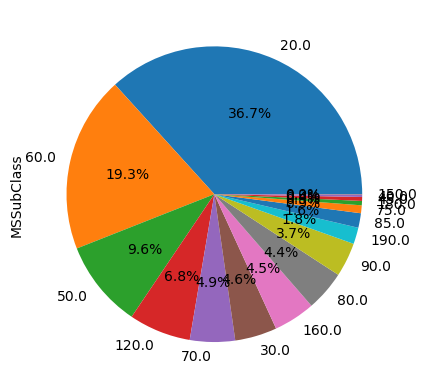

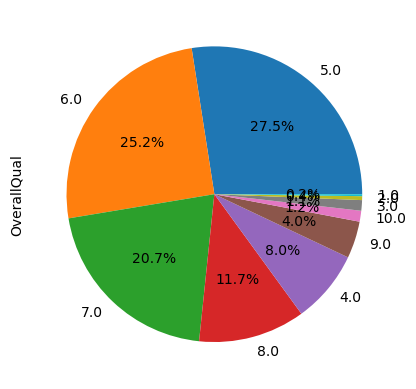

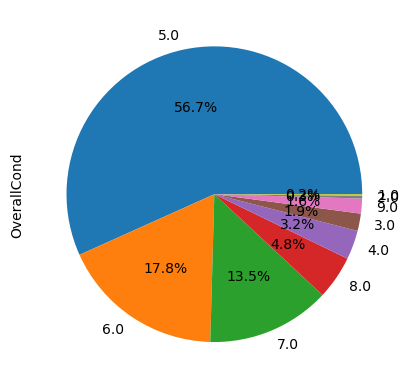

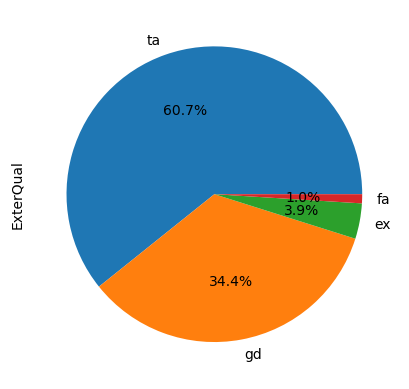

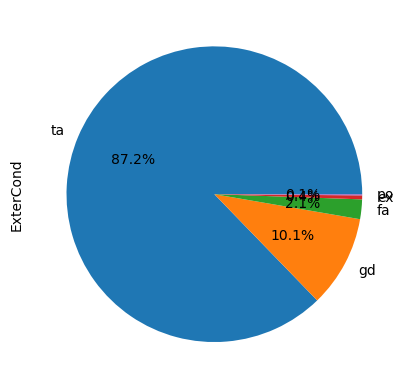

...

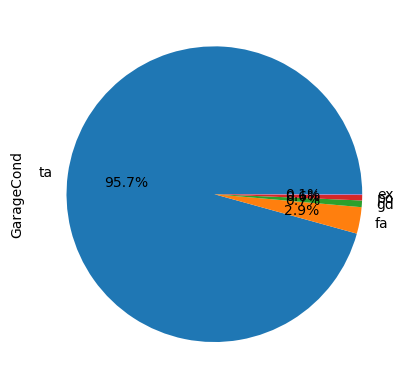

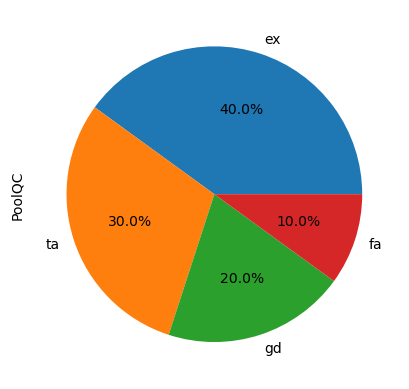

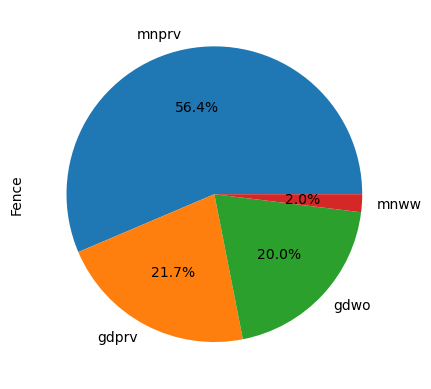

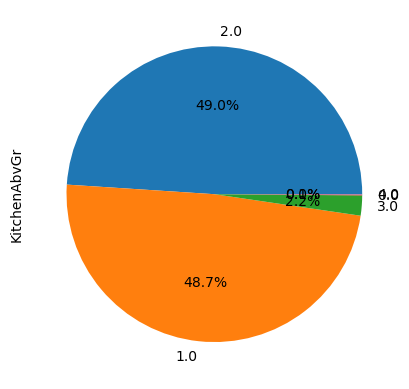

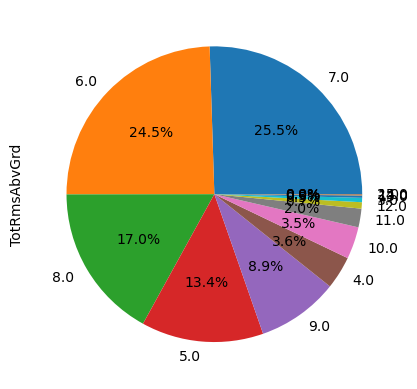

In [868]:
for column in ordinal_columns:
    data_counts = train_data[column].value_counts()
    data_counts = data_counts.rename(column)
    plt.figure()
    data_counts.plot.pie(autopct='%1.1f%%')

<div style="color: #9238b7; font-size: 20px;"> 🔹 <b>Discretization</b> </div>
<h5>&nbsp; &nbsp;&nbsp; &nbsp;Merged values and group them as describe in EDA for Categorical and Ordinal features</h5>

In [870]:
# for categorical features:

# key: column , value: categories to keep
categorical_features = {
    'Foundation': ['pconc', 'cblock'],
    'Exterior2nd': ['plywood', 'hdboard', 'wd sdng', 'metalsd', 'vinylsd'],
    'Exterior1st': ['plywood', 'hdboard', 'wd sdng', 'metalsd', 'vinylsd'],
    'LotShape': ['reg', 'ir1']
}

for feature in categorical_features.items():
    train_data[feature[0]] = train_data[feature[0]].apply(lambda x: x if pd.isna(x) or x.lower() in feature[1] else 'other')


# for ordinal features:
# merge values to groups
train_data['MSSubClass'] = np.where(train_data['MSSubClass'] < 60, 1,
                                   np.where(train_data['MSSubClass'] < 100, 2,
                                   np.where(train_data['MSSubClass'] <= 190, 3,
                                   np.nan)))

train_data['OverallQual'] = np.where(train_data['OverallQual'] < 6, 1,
                                   np.where(train_data['OverallQual'] == 6, 2,
                                   np.where(train_data['OverallQual'] > 6, 3,
                                   np.nan)))

train_data['OverallCond'] = np.where(train_data['OverallCond'] < 5, 1,
                                   np.where(train_data['OverallCond'] == 5, 2,
                                   np.where(train_data['OverallCond'] > 5, 3,
                                   np.nan)))

train_data['BsmtFullBath'] = np.where(train_data['BsmtFullBath'] > 2, 2, np.nan)
train_data['FullBath'] = np.where(train_data['FullBath'] > 2, 2, np.nan)
train_data['HalfBath'] = np.where(train_data['HalfBath'] > 2, 2, np.nan)
train_data["TotRmsAbvGrd"] = train_data["TotRmsAbvGrd"].clip(lower=4, upper=11)

# key: change-code , value: values to change
ordinal_replace_dict = {
    1: {
    'po': 1, 'fa': 1, 'ta': 1,
    'gd': 2, 'ex': 2
   },
    2: {
    'slvl': 1, 'sfoyer': 1, '2.5unf': 1, '2.5fin': 1, '2story': 1,
    '1.5fin': 2, '1.5unf': 2, '1story': 2
   },
    3: {
    'ma': 1, 'no': 1,
    'av': 2,'gd': 2, 'mn': 2
   },
    4: {
    'na': 1, 'unf': 1,
    'rec': 2,'blq': 2, 'lwq': 2,
    'alq': 3, 'glq': 3
   },
    5: {
    'po': 1, 'fa': 2, 'ta': 3, 'gd': 4, 'ex': 5
   },
    6: {
    'na': 1, 'mnww': 1, 'gdwo': 1,
    'mnprv': 2, 'gdprv': 3
   }
}

# columns and their change-code in the dictionary above
ordinal_features = [('ExterQual', 1), ('ExterCond', 1), ('KitchenQual', 1), ('FireplaceQu', 1), ('BsmtQual', 1),
                    ('HouseStyle', 2), ('BsmtExposure', 3), ('BsmtFinType1', 4), ('PoolQC', 5), ('Fence', 6)]

for feature in ordinal_features:
    train_data[feature[0]] = train_data[feature[0]].replace(ordinal_replace_dict[feature[1]])

<div style="color: #9238b7; font-size: 20px;"> 🔹 <b>Delete features and samples</b> </div>
<h5>&nbsp; &nbsp;&nbsp; &nbsp;Fixed features as explained in EDA</h5>

In [872]:
deleted_columns = ["PoolArea", "MiscVal", "MSZoning", "Street", "LandContour", "LandContour", "Utilities", "LotConfig", "LandSlope",
                   "Condition1", "Condition2", "BldgType", "RoofStyle", "RoofMatl", "MasVnrType", "Heating", "CentralAir", "BsmtHalfBath",
                   "PavedDrive", "MiscFeature", "SaleType", "SaleCondition", "BsmtCond", "BsmtFinType2", "HeatingQC", "Functional",
                   "GarageType", "GarageQual", "GarageCond", "MasVnrArea", "BsmtFinSF1", "BsmtFinSF2", "LowQualFinSF", "WoodDeckSF",
                   "OpenPorchSF", "ExterCond", "EnclosedPorch", "3SsnPorch", "ScreenPorch", "BedroomAbvGr", "KitchenAbvGr", "GarageYrBlt"]

train_data = train_data.drop(columns=deleted_columns)

condition = (
    (train_data['YrSold'].isna() | (train_data['YrSold'] <= 2024)) & 
    (train_data['YearBuilt'].isna() | (train_data['YearBuilt'] <= 2024)) & 
    (train_data['MoSold'].isna() | (train_data['MoSold'] >= 1)) & 
    (train_data['SalePrice'].isna() | ((train_data['SalePrice'] >= 0) & (train_data['SalePrice'] < 903907216))) &
    (train_data['Fireplaces'].isna() | (train_data['Fireplaces'] >= 0)) &
    (train_data['GarageCars'].isna() | (train_data['GarageCars'] >= 0))
)

train_data = train_data[condition]

train_data['YearRemodAdd'] = train_data.apply(
    lambda row: max(row['YearRemodAdd'], row['YearBuilt']) if pd.notna(row['YearRemodAdd']) and pd.notna(row['YearBuilt']) else row['YearRemodAdd'],
    axis=1
)

<div style="font-family: Times; text-align: center; font-size: 25px; font-weight: bold; background-color: #dfc8c6; color: #429eda;">3️⃣ <b>Missing Data</b></div>
<div style="font-family: Times; font-size: 16px; background-color: #EAF2F8; padding: 10px;">
🧹Every feature that have much than 50% of missing data will be deleted, for the others i'll use imputation technics like MICE, KNN and statistic measures </div>

<div style="color: #9238b7; font-size: 15px;"> 🔹See below the proportion of missing data per feature: </div>

Alley           0.936808
BsmtFullBath    0.992614
FullBath        0.728355
HalfBath        0.994666
FireplaceQu     0.501026
PoolQC          0.995897
Fence           0.812064
dtype: float64


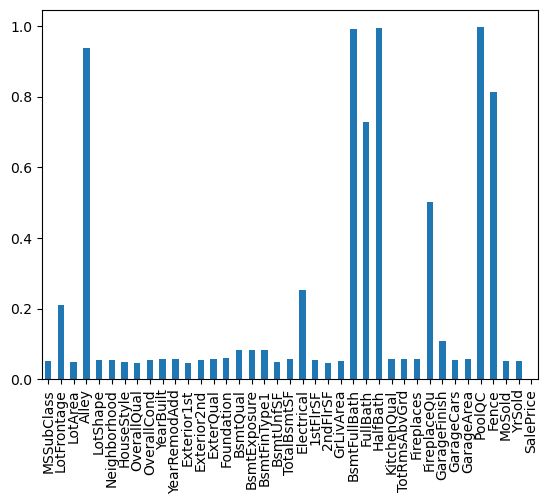

In [875]:
missing_values = train_data.isnull().mean()
missing_values.plot.bar()
print(missing_values[missing_values > 0.5])

coloums_to_delete = missing_values[missing_values > 0.5].index.tolist()
deleted_columns += coloums_to_delete

train_data = train_data.drop(columns=coloums_to_delete)

<div style="font-family: Times; font-size: 16px; background-color: #EAF2F8; padding: 15px;">
📝 The data now have 2 features with 20-25% missing values and the others with less then 10% of missing values.
</div>

<div style="color: #9238b7; font-size: 15px;"> 🔹Build a list of features with missing values </div>

In [878]:
missing_values = train_data.isnull().mean()
missing_values = missing_values.sort_values(axis=0, ascending=False)
columns_list = []
for i in missing_values.items():
    if i[0] != 'SalePrice':
        if i[0] in numeric_columns:
            columns_list.append(('numeric',i[0],i[1]))
        if i[0] in categorical_columns:
            columns_list.append(('categorical',i[0],i[1]))
        if i[0] in ordinal_columns:
            columns_list.append(('ordinal',i[0],i[1]))
        
columns_list.sort(key=lambda x: x[0])
columns_list



[('categorical', 'Electrical', 0.2515387771850636),
 ('categorical', 'GarageFinish', 0.10874025441116127),
 ('categorical', 'Foundation', 0.05949938448912597),
 ('categorical', 'LotShape', 0.054985638079606075),
 ('categorical', 'Exterior2nd', 0.05416495691423882),
 ('categorical', 'Neighborhood', 0.05375461633155519),
 ('categorical', 'Exterior1st', 0.04759950759130078),
 ('numeric', 'LotFrontage', 0.21009437833401723),
 ('numeric', 'GarageArea', 0.05867870332375872),
 ('numeric', 'YearRemodAdd', 0.05867870332375872),
 ('numeric', 'YearBuilt', 0.058268362741075094),
 ('numeric', 'Fireplaces', 0.05785802215839146),
 ('numeric', 'TotalBsmtSF', 0.056627000410340585),
 ('numeric', '1stFlrSF', 0.05621665982765695),
 ('numeric', 'GarageCars', 0.05375461633155519),
 ('numeric', 'GrLivArea', 0.05252359458350431),
 ('numeric', 'MoSold', 0.05211325400082068),
 ('numeric', 'YrSold', 0.0508822322527698),
 ('numeric', 'BsmtUnfSF', 0.05047189167008617),
 ('numeric', 'LotArea', 0.048009848173984404)

<h4>Filling missing values</h4>
i will fill the missing values in section 5.

<div style="font-family: Times; text-align: center; font-size: 25px; font-weight: bold; background-color: #dfc8c6; color: #429eda;">4️⃣ <b>Outlier Analysis</b></div>

<div style="font-family: Times; font-size: 17px; background-color: #EAF2F8; padding: 10px;">
🚨 I cant use a multidimantional Outlier detectation because the data have categorical variables. <br/>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;In sections below i'll fill the missing values and i use one hot encoding so i can use an advanced methods for Multidimantional Outliers analysis.<br/><br/>
  
⚡First i will check for outliers for each <u>Numeric</u> feature without considering missing values,
   <br/> &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;and i will check for samples outliers (inculding all the features space) <b><u>after Section 7 </b></u>
   <br/> &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;i used IQR with 0.25/0.75 quantiles --> outliers will be removed (just 426 samples).
  <br/>
   <br/> <b>Explaination about the hyperparameters:</b>
   <br/>The 1.5 multiplier in IQR is a standard value that effectively detects extreme values in datasets with near-normal distributions, balancing sensitivity and robustness. These are common defaults but can be adjusted based on the dataset’s distribution and the desired strictness of outlier detection.
  <br/><br/>💡To understand outliers in the  <u>Categorical and Ordinal </u> features i used .value_counts() and PieChart as shown in <b>EDA</b> section.
  <br/> &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Rare samples will be deleted but if will be "groups" of rare values they will be merged to "other" value.
   </div>

<div style="color: #9238b7; font-size: 17px;"> 🔹 <b>IQR - Numeric features</b> </div>

In [883]:
# IQR
df = train_data

def detect_outliers_iqr(df, column):
    data = df[column].dropna()
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data < lower_bound) | (data > upper_bound)]
    return outliers

outlier_summary = []

for col in numeric_columns:
    if col in df.columns:

        iqr_outliers = detect_outliers_iqr(df, col)
        iqr_count = len(iqr_outliers)
        
        outlier_summary.append({
            "Feature": col,
            "Outliers by IQR": iqr_count
        })

outlier_summary_df = pd.DataFrame(outlier_summary)
display(outlier_summary_df)


,Feature,Outliers by IQR
0,LotFrontage,117
1,LotArea,99
2,Fireplaces,0
3,BsmtUnfSF,47
4,TotalBsmtSF,104
5,1stFlrSF,38
6,2ndFlrSF,38
7,GrLivArea,57
8,GarageArea,10
9,GarageCars,132


<div style="color: #9238b7; font-size: 17px;"> 🔹 <b>Remove outliers samples (Numeric variables)</b> </div>

In [885]:
start_len = len(train_data)

for column in numeric_columns:
    if column in df.columns:
            
        Q1 = train_data[column].quantile(0.25)
        Q3 = train_data[column].quantile(0.75)
        IQR = Q3 - Q1
        
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        mask = (train_data[column].isna()) | ((train_data[column] >= lower_bound) & (train_data[column] <= upper_bound))
        
        train_data = train_data[mask]


end_len = len(train_data)
print(f"{start_len - end_len} samples has been removed")
        

534 samples has been removed


<div style="color: #9238b7; font-size: 17px;"> 🔹 <b>Categorical outliers</b> </div>
<h5>&nbsp; &nbsp;&nbsp; &nbsp;<u>Neighborhood</u> - according to the pie chart in EDA section, it seems pretty logical to group the values ​​that are below 0.02 of proportion.</h5>

<Axes: ylabel='Neighborhood'>

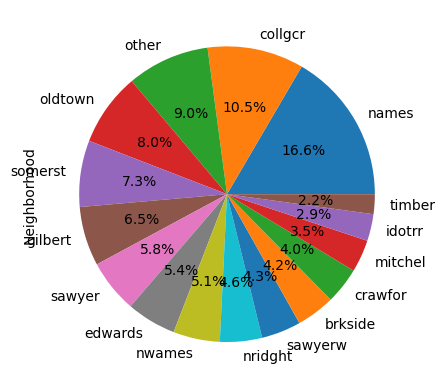

In [887]:
# Calculate proportions of each value in "Neighborhood"
proportions = train_data["Neighborhood"].value_counts(normalize=True)

# Replace values with "other" if their proportion is less than 0.02, keep NaNs
train_data["Neighborhood"] = train_data["Neighborhood"].apply(
    lambda x: "other" if pd.notna(x) and proportions[x] < 0.02 else x
)

data_counts = train_data['Neighborhood'].value_counts()
data_counts = data_counts.rename('Neighborhood')
plt.figure()
data_counts.plot.pie(autopct='%1.1f%%')

<div style="font-family: Times; text-align: center; font-size: 25px; font-weight: bold; background-color: #dfc8c6; color: #429eda;">5️⃣ <b>Feature Engineering</b></div>

<div style="font-family: Times; font-size: 17px; background-color: #EAF2F8; padding: 15px;">
✅ At each Section above, i performed the operations appropriate to the conclusions that resulted.

<div style="color: #9238b7; font-size: 15px;"> 🔹 Now i will create 2 train data sets, one with missing values (for XGBoost) and other with filled missing values </div>

In [891]:
train_data_with_missing_values = train_data.copy()
train_data_imputed = train_data.copy()

<div style="color: #D35400; font-size: 18px;"> 🏗<b>Scaling</b></div> </br>
<div style="color: #9238b7; font-size: 15px;"> 🔹Before filling the missing value i will use MinMaxScaler on <u>Numerical</u> variables,
because the distribution of the features is unknown.</br>
&nbsp;&nbsp; &nbsp;In addition, i save the min/max value for each feature for the test data scaling..</div>

In [893]:
scaler = MinMaxScaler()

# without year and mounth
numeric_features = ['LotFrontage', 'GarageArea', 'TotalBsmtSF', '1stFlrSF', 'GrLivArea', 'BsmtUnfSF', 'LotArea', '2ndFlrSF']

scaler.fit(train_data_imputed[numeric_features])
train_data_imputed[numeric_features] = scaler.transform(train_data_imputed[numeric_features])

# Save min/max values for later use
scaler_params = {col: {'min': scaler.data_min_[i], 'max': scaler.data_max_[i]} for i, col in enumerate(numeric_features)}


<div style="color: #D35400; font-size: 18px;"> 📝<b> Filling the missing data</b></div> </br>
<div style="color: #9238b7; font-size: 15px;"> 
    <b><u>Explaination:</u></b></br>
    1. Categorical: if the proportion bigger then 0.1 use fancyimpute KNN, else use mode</br>
    2. Numeric: use MICE</br>
    3. Ordinal: if the proportion bigger then 0.05 use KNN else use median.</br>
</div>

In [895]:
# Function to handle imputation
def impute_data(df, columns_list):
    label_encoders = {}  # Store encoders for categorical columns

    for col_type, col_name, missing_proportion in columns_list:
        if col_name not in df.columns:
            continue  # Skip if column doesn't exist

        if col_type == 'categorical':
            if missing_proportion > 0.1:
                # Step 1: Encode categorical data before KNN (to avoid ValueError)
                le = LabelEncoder()
                temp_col = df[col_name].dropna()  # Drop NaN for fitting
                le.fit(temp_col)
                label_encoders[col_name] = le  # Store encoder for inverse transform
                
                # Transform column (NaN values remain unchanged)
                df[col_name + '_encoded'] = df[col_name].map(lambda x: le.transform([x])[0] if x in le.classes_ else np.nan)
                
                # Step 2: Apply KNN Imputer
                df[[col_name + '_encoded']] = KNN(k=5).fit_transform(df[[col_name + '_encoded']])
                
                # Step 3: Decode back to original categories
                df[col_name] = df[col_name + '_encoded'].map(lambda x: le.inverse_transform([int(x)])[0] if not pd.isna(x) else np.nan)
                
                # Drop the temporary encoded column
                df.drop(columns=[col_name + '_encoded'], inplace=True)
            else:
                # Use mode imputation for categorical
                mode_value = df[col_name].mode()[0]
                df[col_name] = df[col_name].fillna(mode_value)

        elif col_type == 'numeric':
            # Use MICE (Iterative Imputer) for numeric features
            imputer = IterativeImputer(max_iter=10, random_state=42)
            df[[col_name]] = imputer.fit_transform(df[[col_name]])

        elif col_type == 'ordinal':
            if missing_proportion > 0.05:
                # Use KNN Imputer for ordinal
                imputer = KNNImputer(n_neighbors=5)
                df[[col_name]] = imputer.fit_transform(df[[col_name]])
            else:
                # Use median imputation for ordinal
                median_value = df[col_name].median()
                df[col_name] = df[col_name].fillna(median_value)

    return df

train_data_imputed = impute_data(train_data_imputed, columns_list)



Imputing row 1/1903 with 1 missing, elapsed time: 0.365
Imputing row 101/1903 with 0 missing, elapsed time: 0.367
Imputing row 201/1903 with 0 missing, elapsed time: 0.367
Imputing row 301/1903 with 0 missing, elapsed time: 0.367
Imputing row 401/1903 with 0 missing, elapsed time: 0.367
Imputing row 501/1903 with 0 missing, elapsed time: 0.369
Imputing row 601/1903 with 0 missing, elapsed time: 0.369
Imputing row 701/1903 with 0 missing, elapsed time: 0.369
Imputing row 801/1903 with 1 missing, elapsed time: 0.369
Imputing row 901/1903 with 0 missing, elapsed time: 0.371
Imputing row 1001/1903 with 0 missing, elapsed time: 0.371
Imputing row 1101/1903 with 0 missing, elapsed time: 0.371
Imputing row 1201/1903 with 0 missing, elapsed time: 0.371
Imputing row 1301/1903 with 0 missing, elapsed time: 0.371
Imputing row 1401/1903 with 1 missing, elapsed time: 0.373
Imputing row 1501/1903 with 0 missing, elapsed time: 0.373
Imputing row 1601/1903 with 0 missing, elapsed time: 0.373
Imputing 

<div style="color: #D35400; font-size: 18px;"> 📟<b> Feature Extraction</b></div> </br>
<div style="color: #9238b7; font-size: 15px;"> 
    <b><u>Add Columns:</u></b></br>
     1. ill multiply OverallQual * LotArea - multiplying these two factors can explain whether size is prestigious.</br>
 2. for 'Neighborhood' categorical column i make a new column that replaces values with their occurrence frequency</br>
 3. for 'OverallQual' ordinal column i make a new column that converts variables into ranks
</div>

In [897]:
# make new columns for the train_data_imputed
train_data_imputed['OverallQual_LotArea'] = train_data_imputed['OverallQual'] * train_data_imputed['LotArea']
freq_encoding = train_data_imputed['Neighborhood'].value_counts(normalize=True)
train_data_imputed['Neighborhood_Freq'] = train_data_imputed['Neighborhood'].map(freq_encoding)
train_data_imputed['OverallQual_Rank'] = train_data_imputed['OverallQual'].rank()

# make new columns for the train_data_with_missing_values
train_data_with_missing_values['OverallQual_LotArea'] = train_data_with_missing_values['OverallQual'] * train_data_with_missing_values['LotArea']
freq_encoding = train_data_with_missing_values['Neighborhood'].value_counts(normalize=True)
train_data_with_missing_values['Neighborhood_Freq'] = train_data_with_missing_values['Neighborhood'].map(freq_encoding)
train_data_with_missing_values['OverallQual_Rank'] = train_data_with_missing_values['OverallQual'].rank()

<div style="color: #9238b7; font-size: 15px;"> 
    <b><u>One-hot encoding</u></b></br>
     Before use one-hot encoding to convert categories into binary vectors ill save the categories for the test set</br>
ill save them in dictionary - key: feature name, value: list of categories</br>
the new columns will be like column_name_value
</div>

In [899]:
categories_dictionary = { }

categories_features = ['Electrical', 'GarageFinish', 'Foundation', 'LotShape',
                        'Exterior2nd', 'Neighborhood', 'Exterior1st']

for feature in categories_features:
    categories_dictionary[feature] = train_data_imputed[feature].dropna().unique().tolist() 

In [900]:
# one hot encoding
train_data_imputed = pd.get_dummies(train_data_imputed, prefix_sep='_', prefix=categories_features)
train_data_with_missing_values = pd.get_dummies(train_data_with_missing_values, prefix_sep='_', prefix=categories_features)

<div style="color: #9238b7; font-size: 15px;">🔹 After the one hot encoding the data will have 76 columns.</div>

<div style="color: #D35400; font-size: 18px;"> 🎯<b> Feature Selection</b></div> </br>
<pre style="color: #9238b7; font-size: 15px;">
First i plot the 40 top features according to the variance by using VarianceThreshold, than after explore the plot i used RFE to choose 35 features. so i reduced the number of features to 1/2 for avoid overfiting and recieve better results.
    
<u>More about the methods:</u>
Recursive Feature Elimination (RFE) is a feature selection technique that iteratively removes the least important features based on a machine learning model's importance scores. It starts with all features, ranks them using model coefficients (e.g., from a Random Forest or Logistic Regression), and recursively eliminates the weakest ones until only the top n_features remain. This method helps improve model performance by reducing noise and focusing on the most relevant predictors
</pre>

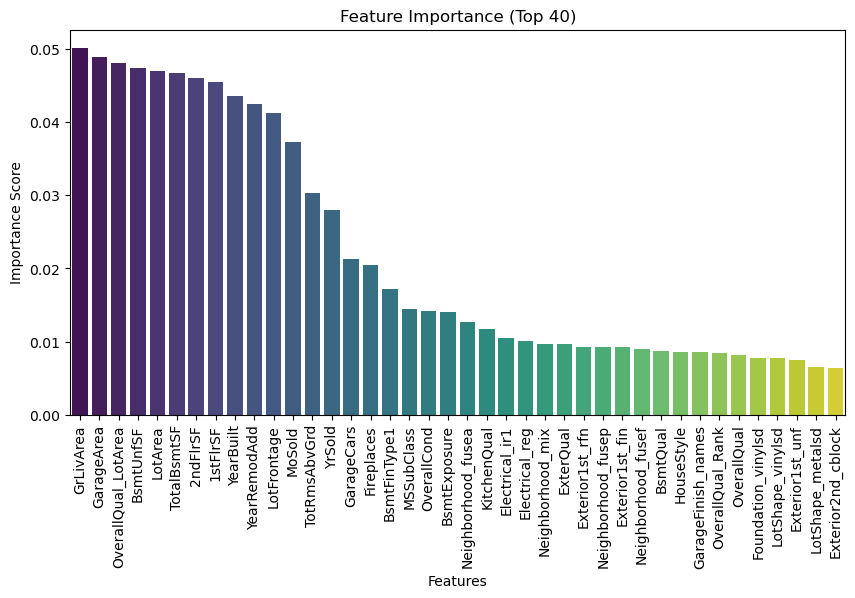

top_features = Index(['GrLivArea', 'GarageArea', 'OverallQual_LotArea', 'BsmtUnfSF',
       'LotArea', 'TotalBsmtSF', '2ndFlrSF', '1stFlrSF', 'YearBuilt',
       'YearRemodAdd', 'LotFrontage', 'MoSold', 'TotRmsAbvGrd', 'YrSold',
       'GarageCars', 'Fireplaces', 'BsmtFinType1', 'MSSubClass', 'OverallCond',
       'BsmtExposure', 'Neighborhood_fusea', 'KitchenQual', 'Electrical_ir1',
       'Electrical_reg', 'Neighborhood_mix', 'ExterQual', 'Exterior1st_rfn',
       'Neighborhood_fusep', 'Exterior1st_fin', 'Neighborhood_fusef',
       'BsmtQual', 'HouseStyle', 'GarageFinish_names', 'OverallQual_Rank',
       'OverallQual', 'Foundation_vinylsd', 'LotShape_vinylsd',
       'Exterior1st_unf'],
      dtype='object')
Selected Features: ['GrLivArea', 'GarageArea', 'OverallQual_LotArea', 'BsmtUnfSF', 'LotArea', 'TotalBsmtSF', '2ndFlrSF', '1stFlrSF', 'YearBuilt', 'YearRemodAdd', 'LotFrontage', 'MoSold', 'TotRmsAbvGrd', 'YrSold', 'GarageCars', 'Fireplaces', 'BsmtFinType1', 'MSSubClass', 'Overal

In [903]:
target_column = "SalePrice"

# Split features and target
X = train_data_imputed.drop(columns=[target_column])
y = train_data_imputed[target_column]

# Step 1: Remove low-variance features
var_threshold = 0.007 # Adjust threshold if needed
var_selector = VarianceThreshold(threshold=var_threshold)
X_var_selected = var_selector.fit_transform(X)

# Get remaining feature names
selected_features = X.columns[var_selector.get_support()]
X_var_selected = pd.DataFrame(X_var_selected, columns=selected_features)

# Step 2: Train RandomForest to Get Feature Importance
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_var_selected, y)

# Get feature importance scores
feature_importances = pd.Series(model.feature_importances_, index=selected_features)
feature_importances = feature_importances.sort_values(ascending=False)

# Plot feature importance to decide `n_features`
plt.figure(figsize=(10, 5))
sns.barplot(x=feature_importances[:40].index, y=feature_importances[:40].values, palette="viridis")
plt.xticks(rotation=90)
plt.xlabel("Features")
plt.ylabel("Importance Score")
plt.title("Feature Importance (Top 40)")
plt.show()

# Step 3: Select Top n_features based on Importance
top_features = feature_importances[feature_importances > var_threshold].index
print(f"top_features = {top_features}")

# choose 35 features only.
n_features = 35

# Step 4: Apply Recursive Feature Elimination (RFE) on selected top features
rfe = RFE(model, n_features_to_select=n_features)
X_rfe_selected = rfe.fit_transform(X_var_selected[top_features], y)

# Get final selected feature names
final_selected_features = X_var_selected[top_features].columns[rfe.support_]

# Final reduced dataset
X_final = pd.DataFrame(X_rfe_selected, columns=final_selected_features)

# Show selected features
print("Selected Features:", list(final_selected_features))

In [904]:
# saving the final features.
final_features = list(final_selected_features)
train_data_imputed = train_data_imputed[final_features + ['SalePrice']]

<div style="color: #D35400; font-size: 18px;"> ⚠️<b> Outlier detection on multidimensional</b></div> </br>
<div style="color: #9238b7; font-size: 15px;"> 
Use <b>Isolation forest</b> and <b>LOF</b> with tiny contamination = 0.01 to remove just the extrimists Outliers. so that not too affected the size of the data.</br></br>
In addition, use <b>PCA</b> and plot them to get a feel
</div>

Isolation Forest detected 20 outliers.
Local Outlier Factor detected 20 outliers.
Common outliers detected by both methods: 0


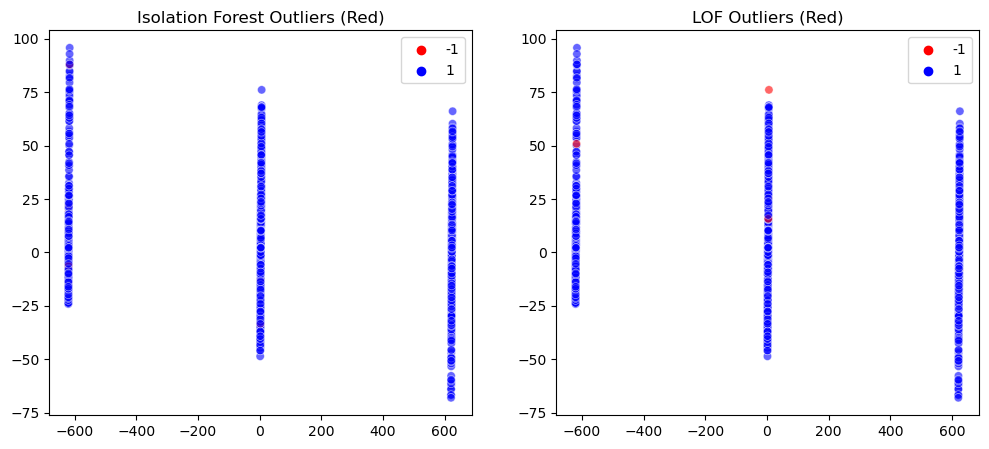

In [906]:
# Assuming no categorical columns and 'target' is the label column (drop if exists)
X = train_data_imputed.drop(columns=["SalePrice"], errors="ignore")  # Drop target if exists

### 1 Apply Isolation Forest ###
iso_forest = IsolationForest(n_estimators=100, contamination=0.01, random_state=42)
iso_outliers = iso_forest.fit_predict(X)  # -1 = Outlier, 1 = Inlier

# Count outliers
iso_outlier_count = np.sum(iso_outliers == -1)
print(f"Isolation Forest detected {iso_outlier_count} outliers.")

### 2 Apply Local Outlier Factor (LOF) ###
lof = LocalOutlierFactor(n_neighbors=20, contamination=0.01)
lof_outliers = lof.fit_predict(X)  # -1 = Outlier, 1 = Inlier

# Count outliers
lof_outlier_count = np.sum(lof_outliers == -1)
print(f"Local Outlier Factor detected {lof_outlier_count} outliers.")

### 3 Compare Overlap ###
outliers_if = set(np.where(iso_outliers == -1)[0])  # Isolation Forest outliers index
outliers_lof = set(np.where(lof_outliers == -1)[0])  # LOF outliers index

common_outliers = outliers_if.intersection(outliers_lof)
print(f"Common outliers detected by both methods: {len(common_outliers)}")

### 4 Visualization (Using PCA for High Dimensions) ###
pca = PCA(n_components=2)  # Reduce to 2D for visualization
X_pca = pca.fit_transform(X)

# Plot Outliers for Isolation Forest
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=iso_outliers, palette={1: "blue", -1: "red"}, alpha=0.6)
plt.title("Isolation Forest Outliers (Red)")

# Plot Outliers for LOF
plt.subplot(1, 2, 2)
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=lof_outliers, palette={1: "blue", -1: "red"}, alpha=0.6)
plt.title("LOF Outliers (Red)")

plt.show()


In [907]:
# Get indices of detected outliers
outliers_if = set(np.where(iso_outliers == -1)[0])  # Isolation Forest outliers
outliers_lof = set(np.where(lof_outliers == -1)[0])  # LOF outliers

all_outliers = outliers_if.union(outliers_lof)

# Convert to a NumPy array if X is a DataFrame
X_array = X.to_numpy()  

# Remove all outliers detected by either method
X_clean_union = pd.DataFrame(X_array[np.setdiff1d(range(X.shape[0]), list(all_outliers))], columns=X.columns)

print(f"Removed {len(all_outliers)} total outliers. New dataset shape: {X_clean_union.shape}")


Removed 40 total outliers. New dataset shape: (1863, 35)


<div style="font-family: Times; text-align: center; font-size: 25px; font-weight: bold; background-color: #dfc8c6; color: #429eda;">6️⃣ <b>Final Data Exploration</b></div>
<div style="color: #9238b7; font-size: 15px;"> Same as in the firsts Sections. Now the data looks much pretty :)</div>


In [909]:
# first i build new lists
numeric_final_features = []
categorical_final_features = []
ordinal_final_features = []

for feature in final_features:
    if feature in numeric_columns:
        numeric_final_features.append(feature)
    elif feature in ordinal_columns:
        ordinal_final_features.append(feature)
    else:
        categorical_final_features.append(feature)

,GrLivArea,GarageArea,BsmtUnfSF,LotArea,TotalBsmtSF,2ndFlrSF,1stFlrSF,YearBuilt,YearRemodAdd,LotFrontage,MoSold,YrSold,GarageCars,Fireplaces
count,1903.000000,1903.000000,1903.000000,1903.000000,1903.000000,1903.000000,1903.000000,1903.000000,1903.000000,1903.000000,1903.000000,1903.000000,1903.000000,1903.000000
mean,0.481228,0.459033,0.328077,0.475306,0.494112,0.453833,0.457913,1971.804031,1986.900056,0.472469,6.237194,2007.760845,2.297659,0.842105
std,0.178355,0.189081,0.232114,0.183750,0.174997,0.184938,0.188099,29.000049,20.291217,0.167141,2.624498,1.278135,0.760157,0.892625
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1885.000000,1950.000000,0.000000,1.000000,2006.000000,1.000000,0.000000
25%,0.347039,0.331684,0.146899,0.371003,0.377385,0.312649,0.315503,1954.000000,1969.000000,0.395604,5.000000,2007.000000,2.000000,0.000000
50%,0.481228,0.459033,0.298615,0.475306,0.480359,0.434368,0.440743,1971.804031,1994.000000,0.472469,6.000000,2008.000000,2.000000,0.842105
75%,0.586936,0.584218,0.460566,0.581445,0.596521,0.575179,0.578796,2000.000000,2005.000000,0.560440,8.000000,2009.000000,3.000000,2.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2013.000000,2013.000000,1.000000,12.000000,2010.000000,4.000000,4.000000


GrLivArea


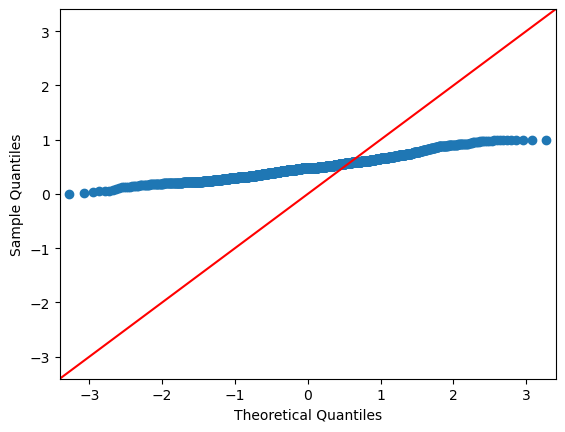

GarageArea


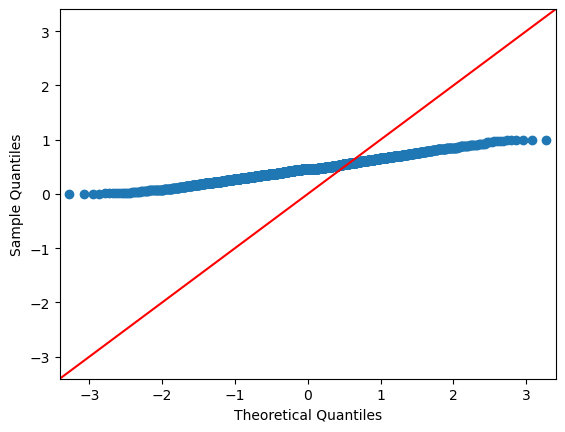

BsmtUnfSF


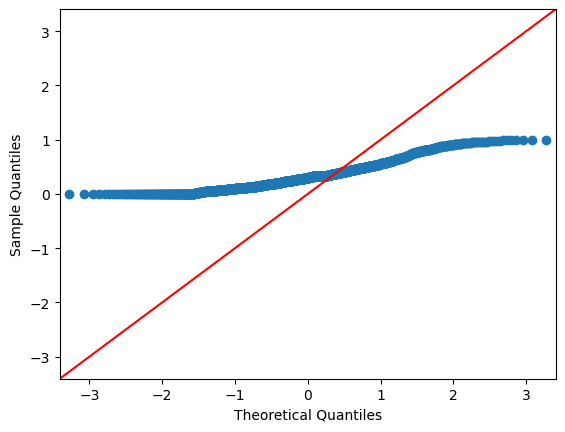

LotArea


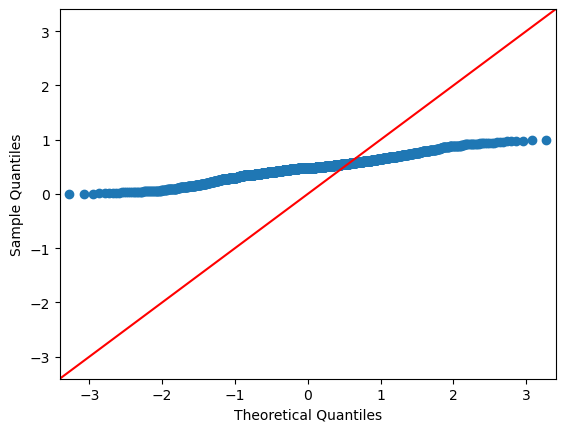

TotalBsmtSF


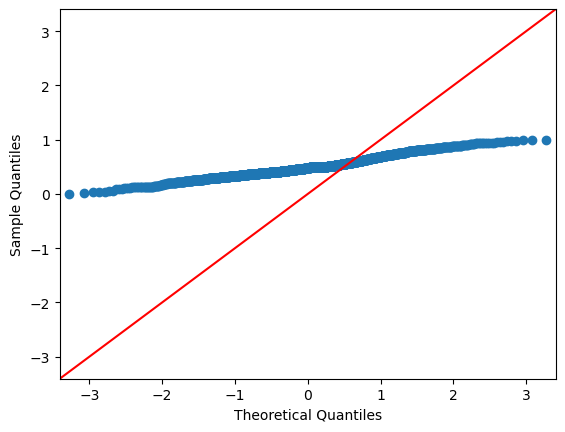

2ndFlrSF


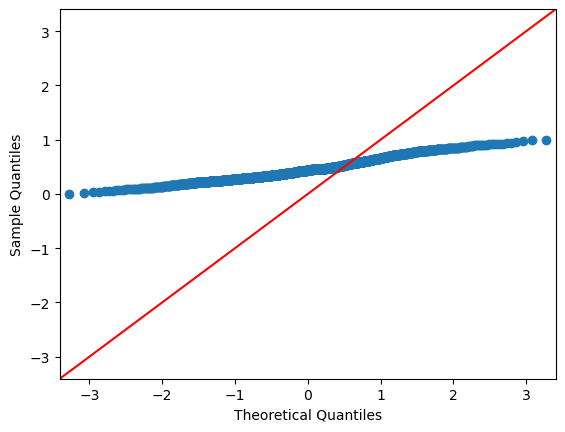

1stFlrSF


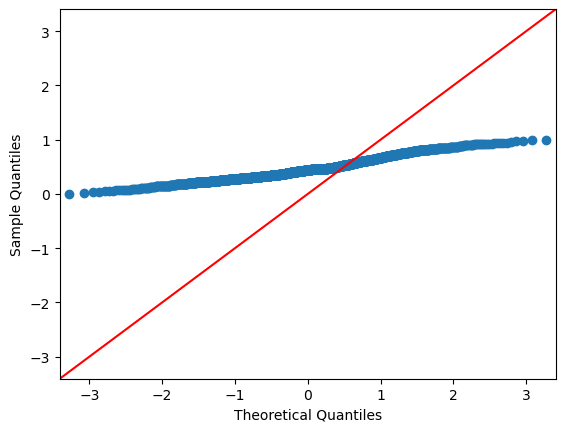

YearBuilt


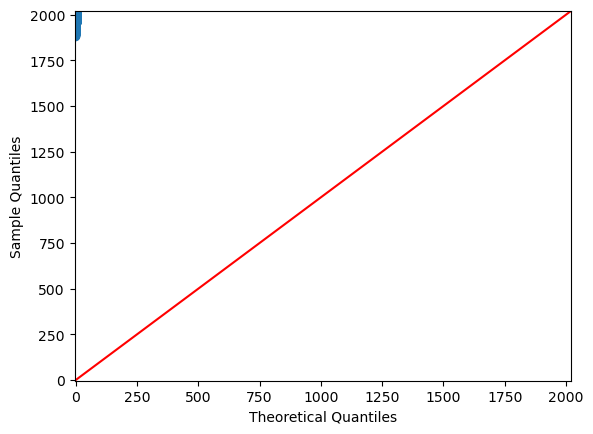

YearRemodAdd


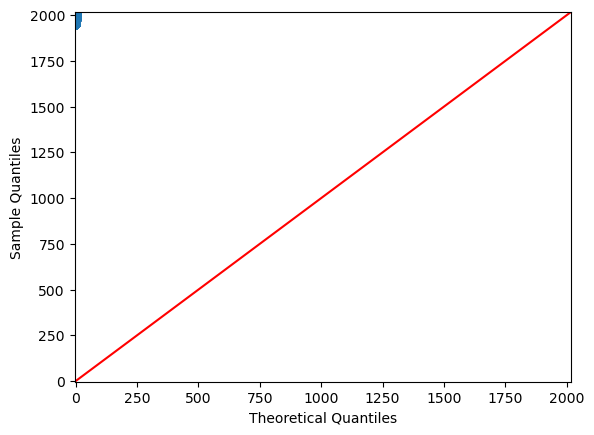

LotFrontage


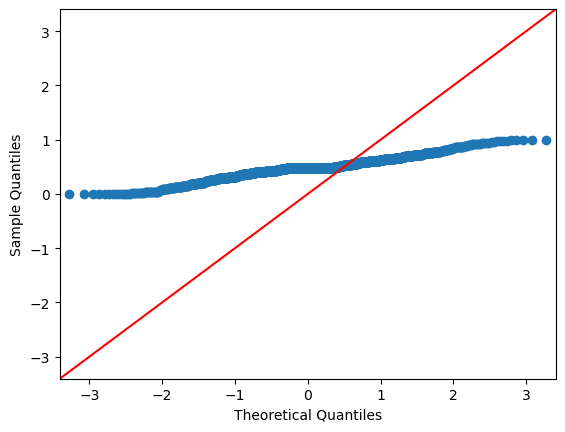

MoSold


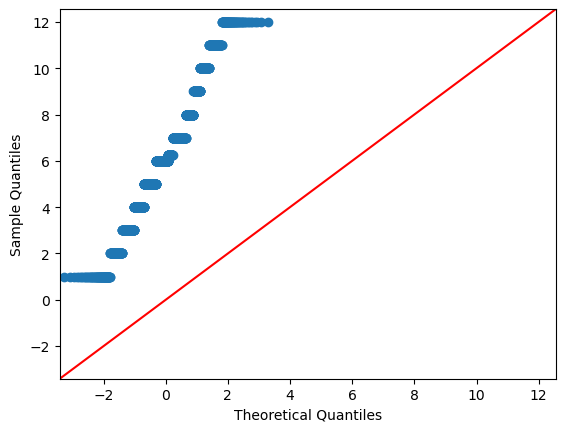

YrSold


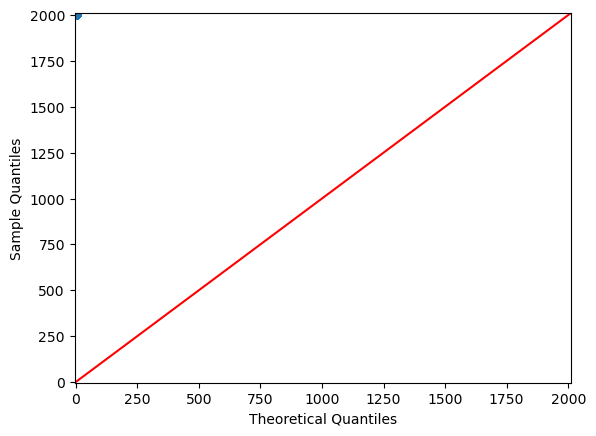

GarageCars


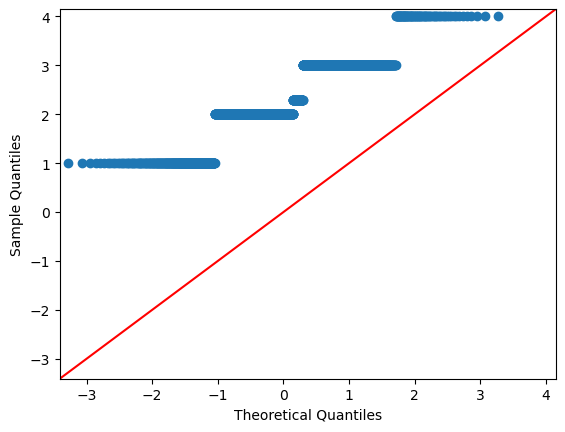

Fireplaces


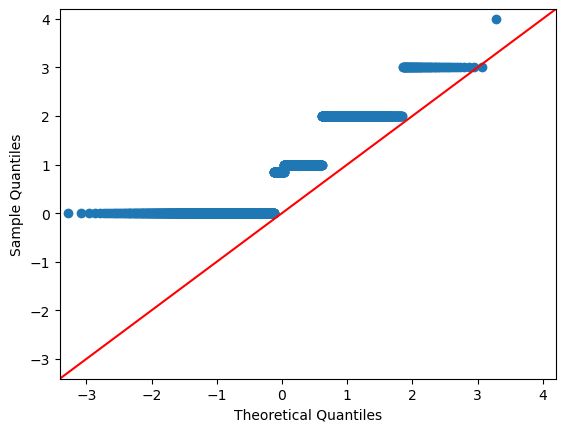

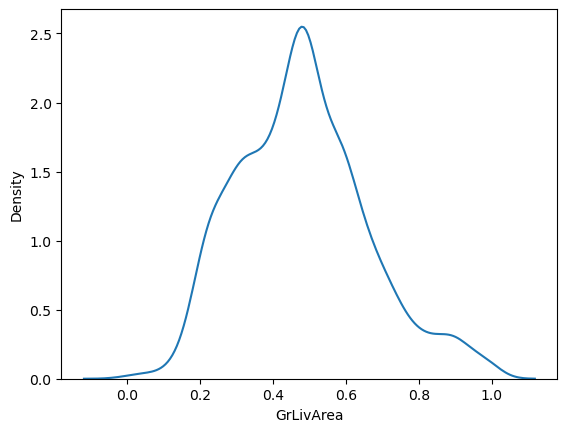

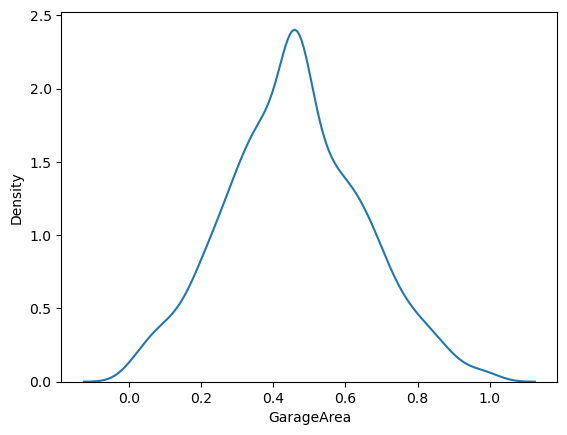

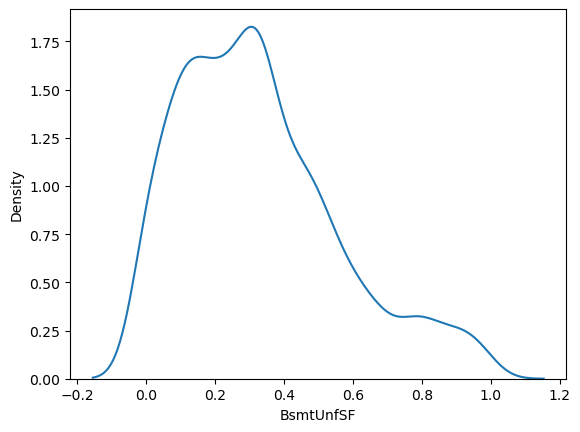

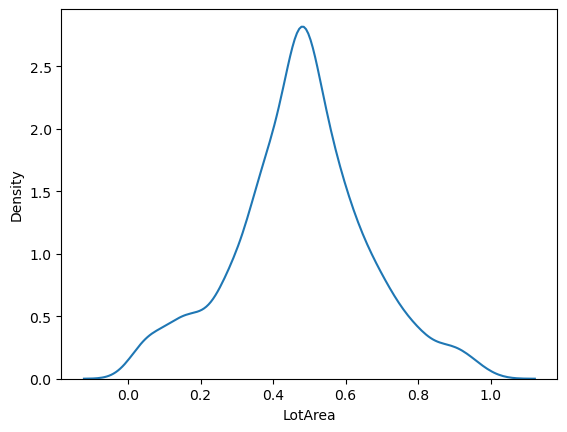

...

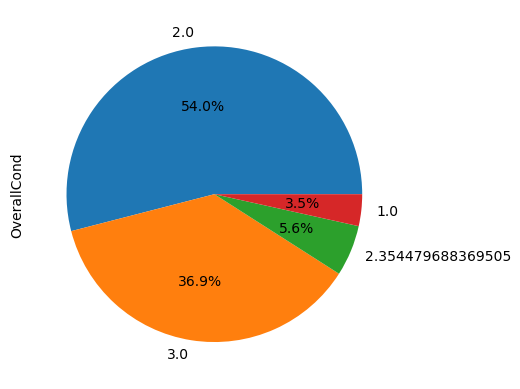

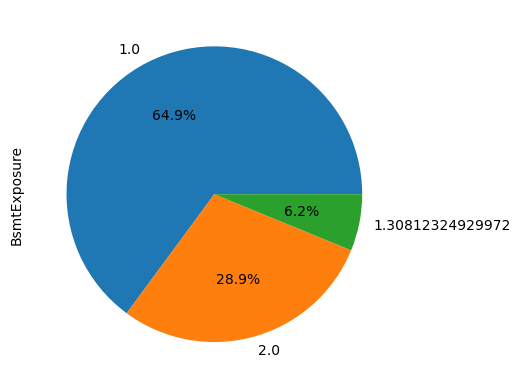

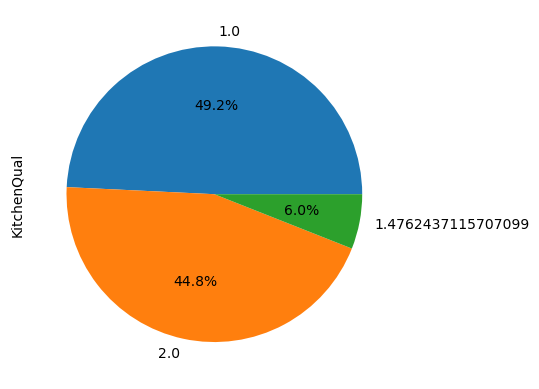

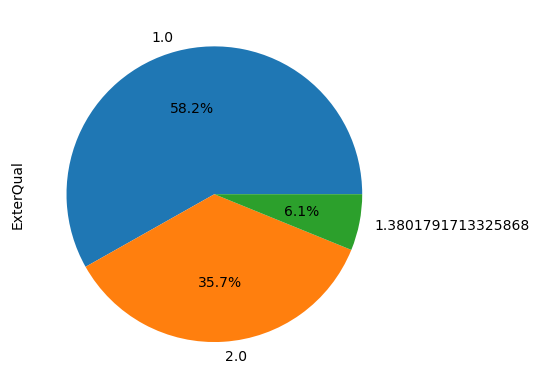

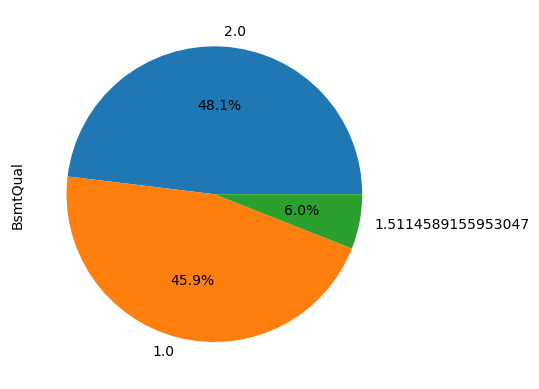

In [910]:
display(train_data_imputed[numeric_final_features].describe())

# plot QQ-plots
for column in numeric_final_features:
    data_points = train_data_imputed[column]
    print(column)
    sm.qqplot(data_points, line ='45') 
    py.show() 

# plot kdeplots
for column in numeric_final_features:
    data_points = train_data_imputed[column]
    plt.figure()
    sns.kdeplot(x=data_points)

for column in ordinal_final_features:
    data_counts = train_data_imputed[column].value_counts()
    data_counts = data_counts.rename(column)
    plt.figure()
    data_counts.plot.pie(autopct='%1.1f%%')

<div style="color: #9238b7; font-size: 17px;"> 🔹 Correlation Matrix </div>
<div style="color: #9238b7; font-size: 14px;"> It can be seen that most of the selected variables have low correlation. </div>

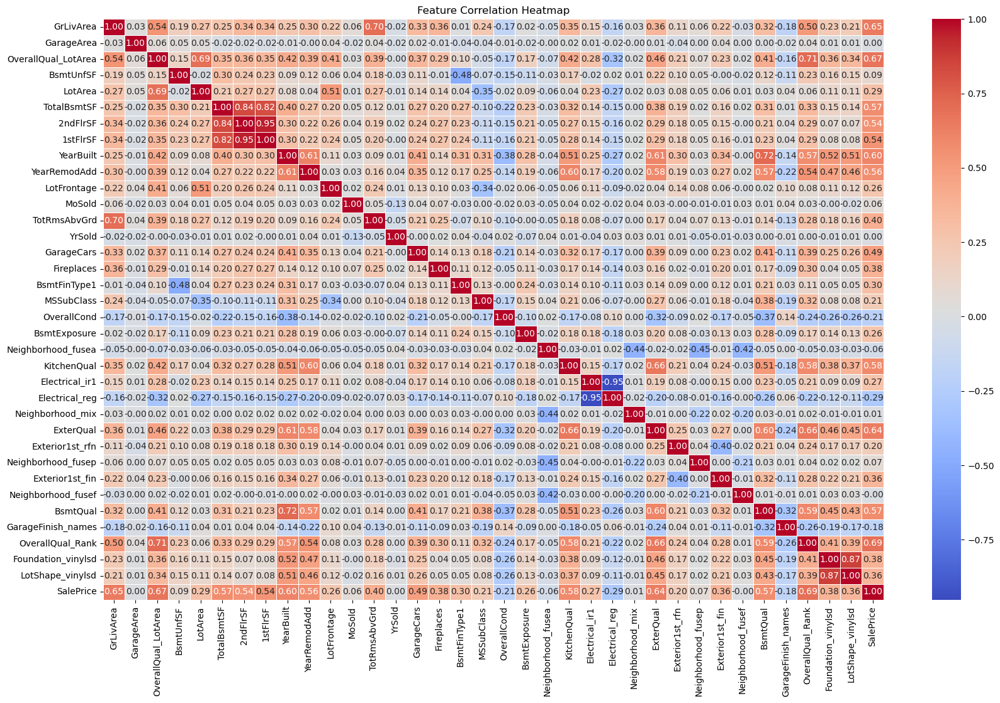

In [912]:
# Compute the correlation matrix
correlation_matrix = train_data_imputed.corr()

# **Optional: Visualize the Correlation Matrix as a Heatmap**
plt.figure(figsize=(20,12))  # Adjust figure size
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt=".2f")
plt.title("Feature Correlation Heatmap")
plt.show()

<div style="font-family: Times; text-align: center; font-size: 25px; font-weight: bold; background-color: #dfc8c6; color: #429eda;">7️⃣ <b>Handaling Multicollinearity</b></div>
<div style="font-family: Times; font-size: 16px; background-color: #EAF2F8; padding: 10px;"> <b><u>Explanation:</u></b> </br> For each pair of columns that have a correlation above 0.9, one of them will be deleted.</br> The one that will be deleted is the one that has the highest average correlation to the other components.</div>

In [914]:
# Compute the correlation matrix
correlation_matrix = train_data_imputed.corr().abs()

# Set diagonal to 0 (to avoid self-correlation)
np.fill_diagonal(correlation_matrix.values, 0)

# Find feature pairs with correlation > 0.9
high_corr_pairs = np.where(correlation_matrix > 0.9)

# Create a list of unique feature pairs (no duplicates)
correlated_features = set()
for i, j in zip(*high_corr_pairs):
    if i < j:  # Avoid duplicates
        correlated_features.add((correlation_matrix.columns[i], correlation_matrix.columns[j]))

print("Highly Correlated Feature Pairs:", correlated_features)

# Compute the average correlation of each feature with all others
avg_corr = correlation_matrix.mean(axis=1)

# Find the feature to remove from each pair
features_to_remove = set()
for feat1, feat2 in correlated_features:
    if avg_corr[feat1] > avg_corr[feat2]:  
        features_to_remove.add(feat1)
    else:
        features_to_remove.add(feat2)

print("Features to be removed:", features_to_remove)

# Display the final dataset
print("\nFinal dataset after removing highly correlated features:")

for feat in features_to_remove:
    if feat in final_features:
        final_features.remove(feat)

train_data_imputed = train_data_imputed[final_features + ['SalePrice']]
train_data_with_missing_values = train_data_with_missing_values[final_features + ['SalePrice']]

Highly Correlated Feature Pairs: {('2ndFlrSF', '1stFlrSF'), ('Electrical_ir1', 'Electrical_reg')}
Features to be removed: {'2ndFlrSF', 'Electrical_reg'}

Final dataset after removing highly correlated features:


<div style="font-family: Times; text-align: center; font-size: 25px; font-weight: bold; background-color: #dfc8c6; color: #429eda;">8️⃣ <b>Training and Hyperparameter Optimization</b></div>
<div style="font-family: Times; font-size: 16px; background-color: #EAF2F8; padding: 10px;">

<b><u>Models:</u></b></br>
<ul>
<li>XGBoost Regressor (Gradient Boosting)</li>
<li>Random Forest Regressor (Ensemble Learning)</li>
<li>ElasticNet Regression (Regularized Linear Model)</li>
</ul>
    
<b><u>Normalize the data:</u></b></br>
<ul>
<li>Tree-based models (XGBoost, Random Forest) → No normalization required</li>
<li>ElasticNet Regression → Requires normalization</li>
</ul>

<b><u>Optimize hyperparameters using:</u></b></br>
<ul>
<li>Bayesian Optimization (efficient for complex models) - 500 iterations per model</li>
<li>K-Fold Cross Validation (for evaluation) - 5 folds</li>
</ul>


<b><u>Explanation of Hyperparameters:</u></b></br>

 &nbsp;&nbsp; <u>Random Forest</u></br>
<ul>
<li>n_estimators: Number of trees in the forest (higher = better accuracy, but slower).</li>
<li>max_depth: Maximum depth of trees (prevents overfitting).</li>
</ul>

 &nbsp;&nbsp; <u>XGBoost</u></br>
<ul>
<li>n_estimators: Number of boosting rounds.</li>
<li>max_depth: Depth of each tree (controls complexity).</li>
<li>learning_rate: Step size shrinkage (prevents overfitting).</li>
</ul>


 &nbsp;&nbsp; <u>ElasticNet Regression</u></br>
<ul>
<li>alpha: Regularization strength (higher = more feature selection).</li>
<li>l1_ratio: Penalty combination L1 and L2.</li>
</ul>

<b><u>Training Data:</u></b></br>
All of the models trained on the imputed train data, XGBoost trained on the two data sets - the imputed and the missing value train data.

</div>

<div style="color: #9238b7; font-size: 15px;"> 🔹 Split to train and test </div>

In [917]:
# Prepare the two train data sets, one with missing values.
train = train_data_imputed
train_missing = train_data_with_missing_values
train_data_imputed.to_csv("processed_data.csv", index=False)
train_data_with_missing_values.to_csv("processed_data_missing_values.csv", index=False)

# Define features and target
X = train.drop(columns=['SalePrice'])
y = train['SalePrice']

X_missing = train_missing.drop(columns=['SalePrice'])
y_missing = train_missing['SalePrice']

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train_missing, X_test_missing, y_train_missing, y_test_missing = train_test_split(X_missing, y_missing, test_size=0.2, random_state=42)

# Normalization (only for ElasticNet Regression)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

<div style="color: #9238b7; font-size: 15px;"> 🔹 Define models and Hyperparameters </div>

In [919]:
# Define models
models = {
    'RandomForest': RandomForestRegressor(random_state=42),
    'XGBoost': xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    'XGBoost_missing': xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    'ElasticNet': ElasticNet()
}

# Hyperparameter tuning using Bayesian Optimization
param_spaces = {
    'RandomForest': {
        'n_estimators': (50, 200),
        'max_depth': (3, 20)
    },
    'XGBoost': {
        'n_estimators': (500, 2000),
        'max_depth': (5, 8),
        'learning_rate': (0.05, 0.08)
    },
    'XGBoost_missing': {
        'n_estimators': (500, 2000),
        'max_depth': (5, 8),
        'learning_rate': (0.05, 0.08)
    },
    'ElasticNet': {
        'alpha': (0.0001, 1.0),
        'l1_ratio': (0.1, 1.0)
    }
}

<div style="color: #9238b7; font-size: 15px;"> 🔹 Training and Optimization</div>

In [921]:
best_models = {}
mae_scores = {}

for model_name, model in models.items():
    print(f"Optimizing {model_name}...")
    bayes_search = BayesSearchCV(model, param_spaces[model_name], n_iter=500, cv=KFold(5), scoring='neg_mean_absolute_error', random_state=42)
    
    if model_name == 'ElasticNet':
        bayes_search.fit(X_train_scaled, y_train)
    elif model_name == 'XGBoost_missing':
        bayes_search.fit(X_train_missing, y_train_missing)
    else:
        bayes_search.fit(X_train, y_train)
    
    best_models[model_name] = bayes_search.best_estimator_
    
    # Predict and evaluate
    if model_name == 'ElasticNet':
        y_pred = best_models[model_name].predict(X_test_scaled)
    elif model_name == 'XGBoost_missing':
        y_pred = best_models[model_name].predict(X_test_missing)
    else:
        y_pred = best_models[model_name].predict(X_test)
    
    mae = mean_absolute_error(y_test, y_pred)
    mae_scores[model_name] = mae
    print(f"Best MAE for {model_name}: {mae:.4f}")
    print("--------------------------------------")


Optimizing XGBoost...
Best MAE for XGBoost: 41282.0972
--------------------------------------
Optimizing XGBoost_missing...
Best MAE for XGBoost_missing: 43006.7354
--------------------------------------


<div style="color: #9238b7; font-size: 15px;"> 🔹 Select best model based on MAE </div>

In [923]:
# Select best model based on MAE
best_model_name = min(mae_scores, key=mae_scores.get)
best_model = best_models[best_model_name]
print(f"Best model: {best_model_name} with MAE: {mae_scores[best_model_name]:.4f}")
print("---------------------------------------")
print(f"Best model hyperparameters: {best_model.get_params()}")
print("---------------------------------------")

# Save the best model
joblib.dump(best_model, "best_model.pkl")
print("Best model saved as best_model.pkl")

Best model: XGBoost with MAE: 41282.0972
---------------------------------------
Best model hyperparameters: {'objective': 'reg:squarederror', 'base_score': 0.5, 'booster': 'gbtree', 'callbacks': None, 'colsample_bylevel': 1, 'colsample_bynode': 1, 'colsample_bytree': 1, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'gamma': 0, 'gpu_id': -1, 'grow_policy': 'depthwise', 'importance_type': None, 'interaction_constraints': '', 'learning_rate': 0.05767636795489288, 'max_bin': 256, 'max_cat_to_onehot': 4, 'max_delta_step': 0, 'max_depth': 6, 'max_leaves': 0, 'min_child_weight': 1, 'missing': nan, 'monotone_constraints': '()', 'n_estimators': 1808, 'n_jobs': 0, 'num_parallel_tree': 1, 'predictor': 'auto', 'random_state': 42, 'reg_alpha': 0, 'reg_lambda': 1, 'sampling_method': 'uniform', 'scale_pos_weight': 1, 'subsample': 1, 'tree_method': 'exact', 'validate_parameters': 1, 'verbosity': None}
---------------------------------------
Best model saved as best_

<div style="font-family: Times; text-align: center; font-size: 25px; font-weight: bold; background-color: #dfc8c6; color: #429eda;">9️⃣ <b>Inference</b></div>

In [966]:
test_data = pd.read_csv("Q1_test_dataset.csv")

<div style="color: #D35400; font-size: 15px;"> 🏗<b> Preprocessing test data</b></div>

<div style="color: #9238b7; font-size: 15px;"> ☑️ Converts values ​​in categorical or ordinal columns to lowercase. (if they strings) </div>

In [970]:
for col in columns_to_lowercase:   # categorical and ordinaal
    if col not in ["MSSubClass", "OverallQual", "OverallCond"] and col in test_data.columns: 
        test_data[col] = test_data[col].apply(lambda x: x.lower() if isinstance(x, str) else x)

<div style="color: #9238b7; font-size: 15px;"> ☑️ Order the years features (YearRemodAdd must be equal or greater then YearBuilt) </div>

In [973]:
test_data['YearRemodAdd'] = test_data.apply(
    lambda row: max(row['YearRemodAdd'], row['YearBuilt']) if pd.notna(row['YearRemodAdd']) and pd.notna(row['YearBuilt']) else row['YearRemodAdd'],
    axis=1
)

<div style="color: #9238b7; font-size: 15px;"> ☑️ Delete columns - according to the features that inculded in the train_data </div>

In [976]:
deleted_columns = []
for col in test_data.columns:
    if col not in train_data.columns:
        deleted_columns.append(col)
        
test_data = test_data.drop(columns=deleted_columns)

<div style="color: #9238b7; font-size: 15px;"> ☑️ Discretization </div>

In [979]:
# ### for categorical features

for feature in categories_dictionary.items():
    if feature[0] in test_data.columns: 
        test_data[feature[0]] = test_data[feature[0]].apply(lambda x: x if pd.isna(x) or x.lower() in feature[1] else 'other')


# ### for ordinal features:

if 'MSSubClass' in test_data.columns:
    test_data['MSSubClass'] = np.where(test_data['MSSubClass'] < 60, 1,
                                       np.where(test_data['MSSubClass'] < 100, 2,
                                       np.where(test_data['MSSubClass'] <= 190, 3,
                                       np.nan)))

if 'OverallQual' in test_data.columns:
    test_data['OverallQual'] = np.where(test_data['OverallQual'] < 6, 1,
                                       np.where(test_data['OverallQual'] == 6, 2,
                                       np.where(test_data['OverallQual'] > 6, 3,
                                       np.nan)))

if 'OverallCond' in test_data.columns:
    test_data['OverallCond'] = np.where(test_data['OverallCond'] < 5, 1,
                                       np.where(test_data['OverallCond'] == 5, 2,
                                       np.where(test_data['OverallCond'] > 5, 3,
                                       np.nan)))

if 'TotRmsAbvGrd' in test_data.columns:
    test_data["TotRmsAbvGrd"] = test_data["TotRmsAbvGrd"].clip(lower=4, upper=11)

for feature in ordinal_features:
    col, code = feature[0], feature[1]
    if col in test_data.columns: 
        test_data[col] = test_data[col].apply(lambda x: x if pd.isna(x) or x.lower() in ordinal_replace_dict[code].keys() else 0)

for feature in ordinal_features:
    if feature[0] in test_data.columns: 
        test_data[feature[0]] = test_data[feature[0]].replace(ordinal_replace_dict[feature[1]])

<div style="color: #9238b7; font-size: 15px;"> ☑️ MinMaxScaler according to the parameters of the training data </div>

In [982]:
if best_model_name != 'XGBoost_missing':
    for feature in scaler_params.keys():
        col_min = scaler_params[feature]['min']
        col_max = scaler_params[feature]['max'] 
        max_min = col_max - col_min
        if feature in test_data.columns: 
            test_data[feature] = test_data[feature].apply(lambda x: (x - col_min) / max_min )

<div style="color: #9238b7; font-size: 15px;"> ☑️ Fill Missing Values  </div>

In [985]:
if best_model_name != 'XGBoost_missing':
    # build a list with the features that ave missing values
    missing_values = test_data.isnull().mean()
    missing_values = missing_values.sort_values(axis=0, ascending=False)
    columns_list = []
    for i in missing_values.items():
        if i[0] != 'SalePrice':
            if i[0] in numeric_columns:
                columns_list.append(('numeric',i[0],i[1]))
            if i[0] in categorical_columns:
                columns_list.append(('categorical',i[0],i[1]))
            if i[0] in ordinal_columns:
                columns_list.append(('ordinal',i[0],i[1]))

In [987]:
# Function to handle imputation
def impute_test_data(df, train_df, columns_list):

    for col_type, col_name, missing_proportion in columns_list:
        if col_name not in df.columns:
            continue  # Skip if column doesn't exist

        if col_type == 'categorical':
            if missing_proportion > 0.1:
                
                # KNN Imputation for Categorical Data
                label_encoders = {}  # Store encoders for categorical columns
                
                # Encode categorical data before KNN (handling NaNs)
                le = LabelEncoder()
                train_df_nonan = train_df[col_name].dropna()
                le.fit(train_df_nonan)
                label_encoders[col_name] = le
                
                train_df[col_name + '_encoded'] = train_df[col_name].map(lambda x: le.transform([x])[0] if pd.notna(x) else np.nan)
                df[col_name + '_encoded'] = df[col_name].map(lambda x: le.transform([x])[0] if pd.notna(x) else np.nan)
                
                # Combine train_df and df for KNN Imputation
                combined_df = pd.concat([train_df[[col_name + '_encoded']], df[[col_name + '_encoded']]], axis=0)
                knn_imp = KNN(k=5)
                combined_df_imputed = knn_imp.fit_transform(combined_df)
                
                # Split back into train_df and df
                train_df[col_name + '_encoded'] = combined_df_imputed[:len(train_df)]
                df[col_name + '_encoded'] = combined_df_imputed[len(train_df):]
                
                # Decode back to original categories
                train_df[col_name] = train_df[col_name + '_encoded'].map(lambda x: le.inverse_transform([int(x)])[0] if pd.notna(x) else np.nan)
                df[col_name] = df[col_name + '_encoded'].map(lambda x: le.inverse_transform([int(x)])[0] if pd.notna(x) else np.nan)
                
                # Drop the temporary encoded column
                train_df.drop(columns=[col_name + '_encoded'], inplace=True)
                df.drop(columns=[col_name + '_encoded'], inplace=True)
                
            else:
                # Use mode imputation for categorical
                mode_value = train_df[col_name].mode()[0]
                df[col_name] = df[col_name].fillna(mode_value)

        elif col_type == 'numeric':
            # Use MICE (Iterative Imputer) for numeric features
            imputer = IterativeImputer(max_iter=10, random_state=42)
            imputer.fit(train_df[[col_name]])
            df[[col_name]] = imputer.transform(df[[col_name]])

        elif col_type == 'ordinal':
            if missing_proportion > 0.05:
                # Use KNN Imputer for ordinal
                imputer = KNNImputer(n_neighbors=5)
                train_df[[col_name]] = imputer.fit_transform(train_df[[col_name]])
                df[[col_name]] = imputer.transform(df[[col_name]])
            else:
                # Use median imputation for ordinal
                median_value = train_df[col_name].median()
                df[col_name] = df[col_name].fillna(median_value)

    return df
    
if best_model_name != 'XGBoost_missing':
    col_list = [col for col in columns_list if col[1] in test_data.columns]
    test_data = impute_test_data(test_data, train_data, col_list)

Imputing row 1/2489 with 0 missing, elapsed time: 0.541
Imputing row 101/2489 with 0 missing, elapsed time: 0.542
Imputing row 201/2489 with 0 missing, elapsed time: 0.542
Imputing row 301/2489 with 0 missing, elapsed time: 0.542
Imputing row 401/2489 with 0 missing, elapsed time: 0.543
Imputing row 501/2489 with 0 missing, elapsed time: 0.543
Imputing row 601/2489 with 0 missing, elapsed time: 0.543
Imputing row 701/2489 with 0 missing, elapsed time: 0.543
Imputing row 801/2489 with 0 missing, elapsed time: 0.544
Imputing row 901/2489 with 0 missing, elapsed time: 0.544
Imputing row 1001/2489 with 0 missing, elapsed time: 0.544
Imputing row 1101/2489 with 0 missing, elapsed time: 0.544
Imputing row 1201/2489 with 0 missing, elapsed time: 0.545
Imputing row 1301/2489 with 0 missing, elapsed time: 0.545
Imputing row 1401/2489 with 0 missing, elapsed time: 0.545
Imputing row 1501/2489 with 0 missing, elapsed time: 0.545
Imputing row 1601/2489 with 0 missing, elapsed time: 0.545
Imputing 

<div style="color: #9238b7; font-size: 15px;"> ☑️ Feature Extraction </div>

In [990]:
# make new columns for the train_data_imputed
test_data['OverallQual_LotArea'] = test_data['OverallQual'] * test_data['LotArea']
freq_encoding = test_data['Neighborhood'].value_counts(normalize=True)
test_data['Neighborhood_Freq'] = test_data['Neighborhood'].map(freq_encoding)
test_data['OverallQual_Rank'] = test_data['OverallQual'].rank()

In [992]:
# one hot encoding
col_list = [col for col in categories_features if col in test_data.columns]
test_data = pd.get_dummies(test_data, prefix_sep='_', prefix=col_list)

In [994]:
# Makes sure the columns match the trained model
for col in final_features:
    if col not in test_data.columns:
        test_data[col] = 0

test_data = test_data[final_features]

<div style="color: #D35400; font-size: 15px;"> 📈<b> Make the predictions</b></div>

In [997]:
X_test_final = test_data.copy()

if best_model_name == 'ElasticNet':
    X_test_final = scaler.transform(X_test_final)

predictions = best_model.predict(X_test_final)

# Save predictions
output = pd.DataFrame({'SalePrice': predictions})
output.to_csv("group_005_output.csv", index=False)


<div style="font-family: Times; text-align: center; font-size: 25px; font-weight: bold; background-color: #dfc8c6; color: #429eda;">🔟 <b>XAI</b></div>
<div style="font-family: Times; font-size: 16px; background-color: #EAF2F8; padding: 10px;">
Both SHAP (SHapley Additive Explanations) and LIME (Local Interpretable Model-agnostic Explanations) are techniques used to explain machine learning model predictions. However, they have different approaches and use cases.
</br></br>

🔹<b><u>SHAP</u></b></br>

Based on game theory, SHAP assigns a contribution value to each feature by calculating Shapley values.
It considers all possible combinations of features and evaluates their impact on the prediction.
Ensures global (overall model behavior) and local (individual predictions) interpretability.
</br>

📌 <u>Advantages:</u></br>
✔ Considers all feature interactions.</br>
✔ Provides global & local explanations.</br>
✔ Consistent and theoretically solid.
</br>

📌 <u>Disadvantages:</u></br>
❌ Computationally expensive, especially for large datasets and complex models.</br>

🔹<b><u>LIME</u></b></br>

LIME perturbs (modifies) the input data slightly and observes how predictions change.</br>
It fits a simple interpretable model (like a linear regression) to approximate how the original model behaves locally around a specific instance.</br>
Only provides local explanations (for specific predictions).
</br>

📌 <u>Advantages:</u></br>
✔ Faster than SHAP.</br>
✔ Works with any machine learning model (model-agnostic).</br>
✔ Easy to interpret.
</br>

📌 <u>Disadvantages:</u></br>
❌ Can be inconsistent for different perturbations.</br>
❌ Does not provide global interpretability (only local).
</div>

In [1000]:
# Load best model
best_model = joblib.load("best_model.pkl")

# Prepare test features (apply scaling if the model requires it)
X_test_final = test_data.copy()
if isinstance(best_model, ElasticNet):  # Normalize if using ElasticNet
    scaler = StandardScaler()
    X_test_final = scaler.fit_transform(X_test_final)

# Convert to numpy array for SHAP
X_test_final = X_test_final.astype(float)
bool_cols = X_test_final.select_dtypes(include=['bool']).columns
X_test_final[bool_cols] = X_test_final[bool_cols].astype(int)

<div style="font-family: Times; font-size: 16px; background-color: #EAF2F8; padding: 10px;">
<div style="color: #9238b7; font-size: 18px;"> 🔥<b> Global interpretability</b></div>
<b>Use summary plot and bar plot</b></br>
<p>It can be seen that globally, the features related to house size, quality, and year have the most impact in most cases, which is quite logical.</p>
</div>

 99%|===================| 582/586 [01:14<00:00]        

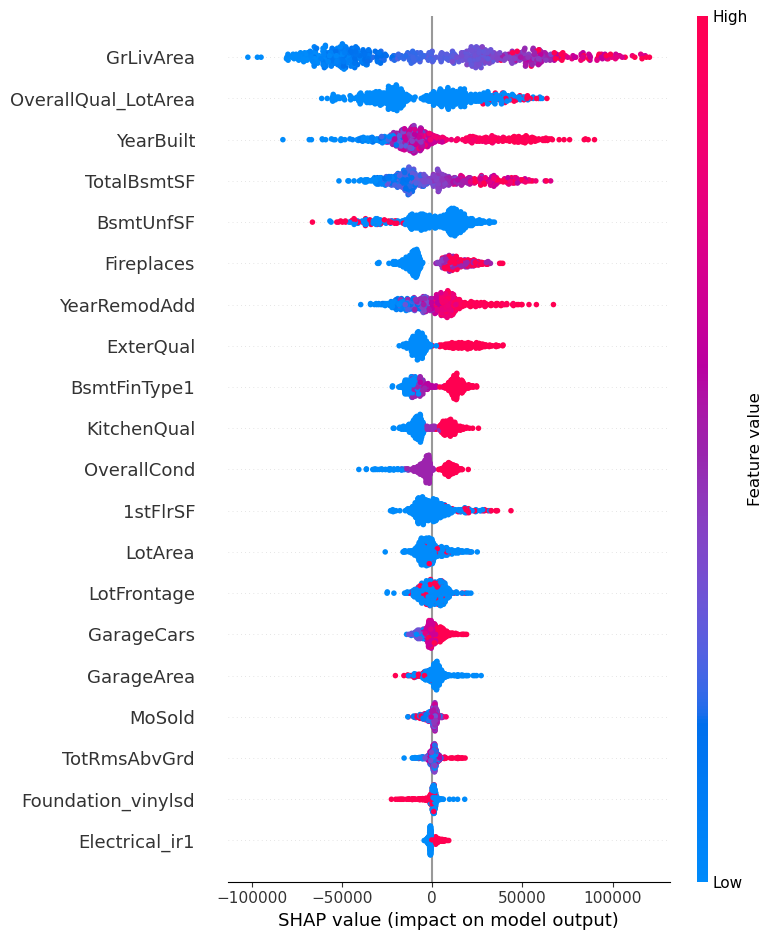

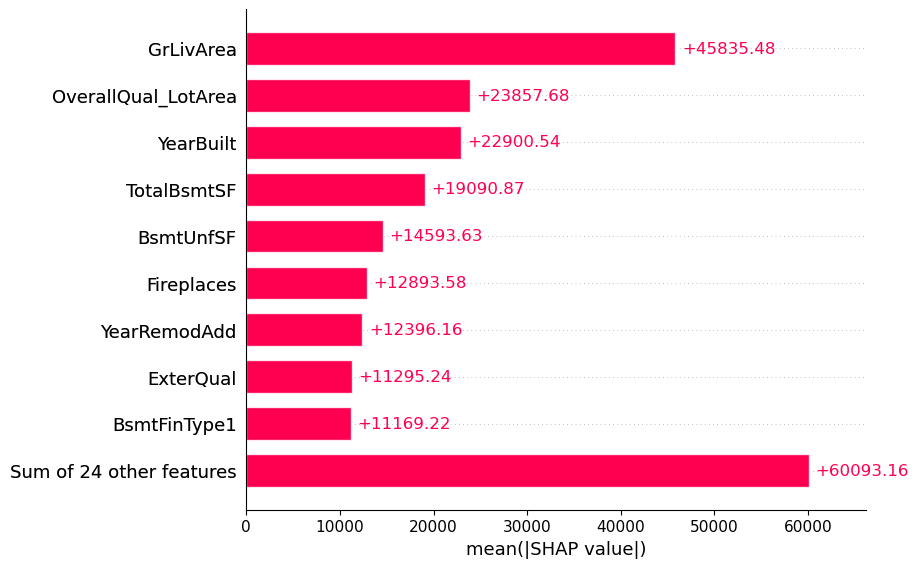

In [1003]:
# Create SHAP explainer
explainer = shap.Explainer(best_model, X_test_final)
shap_values = explainer(X_test_final)

# Global Interpretability - Summary Plot
shap.summary_plot(shap_values, X_test_final)
plt.show()

shap.plots.bar(shap_values)


<div style="font-family: Times; font-size: 16px; background-color: #EAF2F8; padding: 10px;">
<div style="color: #9238b7; font-size: 18px;"> 🔥<b> Local interpretability</b></div>
<b>use SHAP waterfall plot and LIME plot</b>
<p>It can be seen a similarity between the explanations of the two methods, the factors repeat themselves in all cases.
</br>That is, the local explanations of the two methods are indeed compatible.
We can see that the factors that lead globally also lead locally.</p>

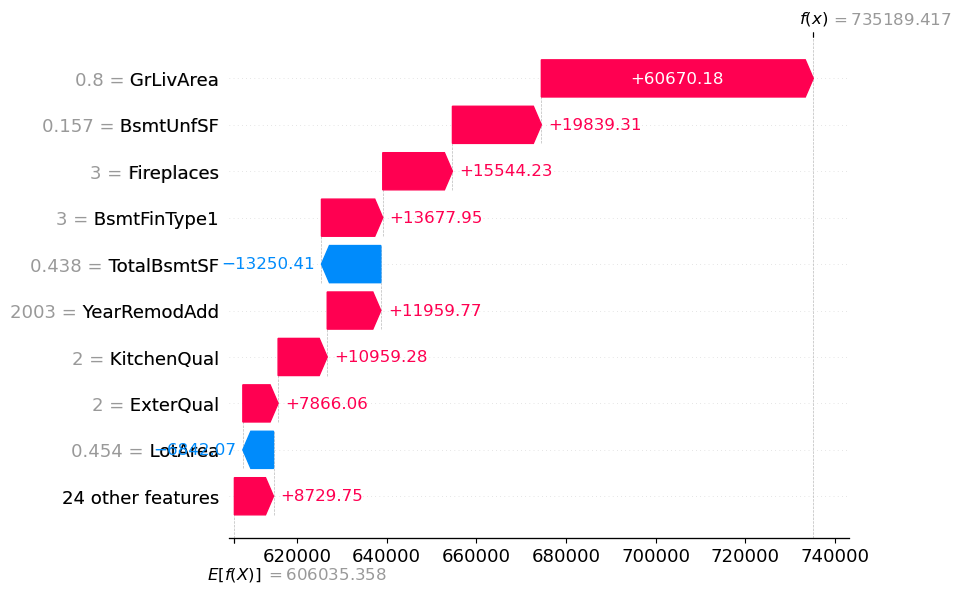

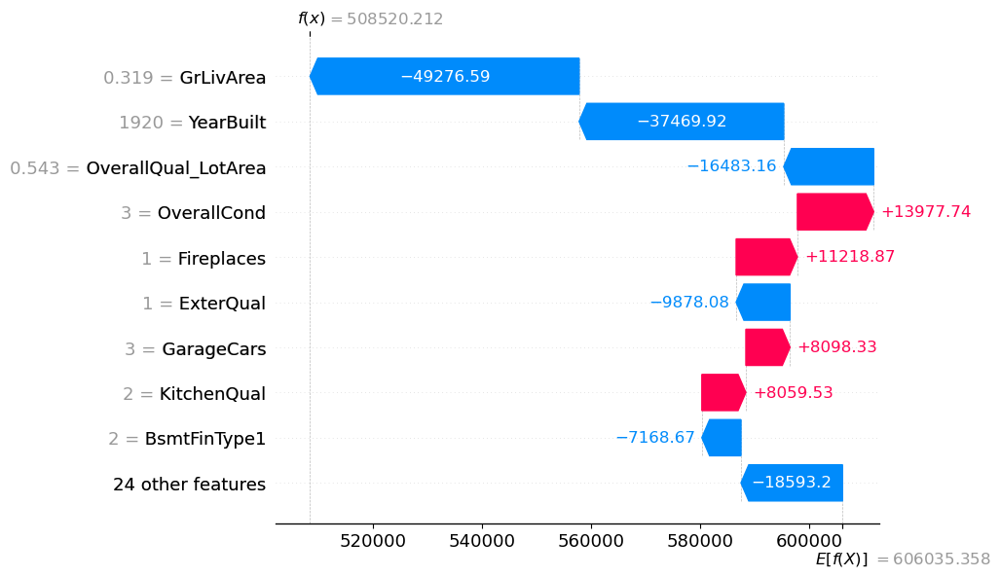

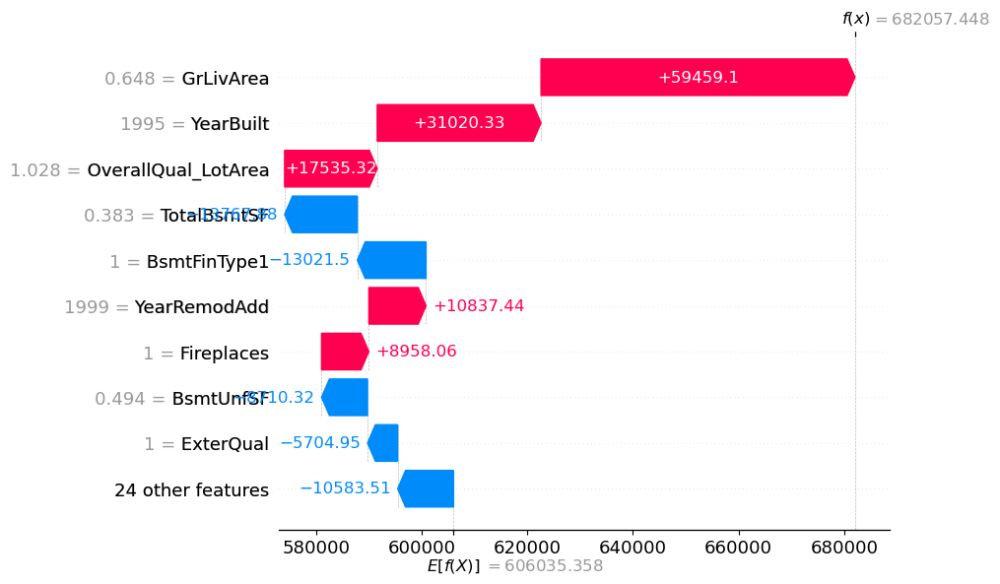

In [1005]:
# Local Interpretability - Explain three test samples
for i in range(3):
    shap.waterfall_plot(shap_values[i])
    plt.show()

In [1019]:
if best_model_name != 'XGBoost_missing':
    # Fill missing values with the mean (or use 'median' / 'most_frequent' if preferred)
    imputer = SimpleImputer(strategy='mean')
    X_test_final_imputed = imputer.fit_transform(X_test_final)
    
    # Convert data to numpy array if required
    X_test_array = np.array(X_test_final_imputed)
    
else:
    # Convert data to numpy array if required
    X_test_array = np.array(X_test_final)
    
# Create a LIME explainer
explainer = LimeTabularExplainer(X_test_array,
                                 feature_names=test_data.columns,
                                 mode="regression")

# Explain three test samples
for i in range(3):
    exp = explainer.explain_instance(X_test_array[i], best_model.predict)
    exp.show_in_notebook()

<div style="text-align: center; font-size: 25px; font-weight: bold; color: #2E86C1;">END OF PART A</div>
<div style="text-align: center; font-size: 20px; color: #555;">THANKS!!!</div>